# Custom Training with YOLOv7

https://learnopencv.com/fine-tuning-yolov7-on-custom-dataset/

# Step 1: Install Requirements

In [ ]:


#clone YOLOv7 
!git clone https://github.com/TimoLob/yolov7.git

%cd yolov7
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images


from google.colab import drive
drive.mount('/content/drive')

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov7'...
remote: Enumerating objects: 582, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 582 (delta 0), reused 2 (delta 0), pack-reused 578
Receiving objects: 100% (582/582), 38.17 MiB | 32.09 MiB/s, done.
Resolving deltas: 100% (286/286), done.
/content/yolov7
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 4.2 MB/s eta 0:00:00
Mounted at /content/drive
Setup complete. Using torch 1.13.1+cu116 (Tesla T4)


# Step 3 Download Weights and create Configuration



# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Download Weights

Download trained model from google drive

In [ ]:
weights = "/content/drive/MyDrive/BA/Final/best.pt"
%mkdir weigths
%cp {weights} /content/yolov7/weigths # copy from gdrive to local machine

weights = "/content/yolov7/weigths/best.pt"

## Validation

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"
image_size = 640 # 640
rf_project = "safety-signs-germany"
dataset_version = 9


from roboflow import Roboflow
rf = Roboflow(api_key=API_KEY)
project = rf.workspace("sicherheitskennzeichnung").project(rf_project)
dataset = project.version(dataset_version).download("yolov5")

!mv /content/datasets/Safety-Signs-Germany-{dataset_version}/train /content/datasets/Safety-Signs-Germany-{dataset_version}/valid # not really necessary, but I had all images in the training data on roboflow when they should be in valid

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Safety-Signs-Germany-9 in yolov5pytorch:: 100%|██████████| 545/545 [00:00<00:00, 2324.30it/s]


In [ ]:
!python test.py --weights {weights} --img {image_size} --data {dataset.location}/data.yaml

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='/content/datasets/Safety-Signs-Germany-9/data.yaml', device='', exist_ok=False, img_size=640, iou_thres=0.65, name='exp', no_trace=False, project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', v5_metric=False, verbose=False, weights=['/content/yolov7/weigths/best.pt'])
YOLOR 🚀 88fc639 torch 1.13.1+cu116 CUDA:0 (Tesla T4, 15109.875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36514136 parameters, 6194944 gradients, 103.3 GFLOPS
 Convert model to Traced-model... 

# Upload Images

In [ ]:
from google.colab import files
#from PIL import Image
import PIL

%mkdir /content/datasets/
upload_path = "/content/datasets/upload/"
%mkdir {upload_path}

def upload_images():
    # Upload images, move them to upload_path and scale them to image size (640,640)
    uploaded = files.upload()

    print(uploaded.keys())

    for f in uploaded.keys():
        %mv "{f}" {upload_path}
        full_path = os.path.join(upload_path,f)
        im = PIL.Image.open(full_path)

        
        #im = im.rotate(-90)
        im = im.resize((image_size,image_size))
        im.save(full_path)


mkdir: cannot create directory ‘/content/datasets/’: File exists


In [ ]:
upload_images()

Saving 20210803_095715_jpg.rf.5bff96654ea53bffa4897d8926daacc2.jpg to 20210803_095715_jpg.rf.5bff96654ea53bffa4897d8926daacc2.jpg
Saving 20210803_100656_jpg.rf.e15b045f5d025e958ef30b40f72f2653.jpg to 20210803_100656_jpg.rf.e15b045f5d025e958ef30b40f72f2653.jpg
Saving 20210827_122649_jpg.rf.19f41529aabfd1ea3dd5e61c3a5f499d.jpg to 20210827_122649_jpg.rf.19f41529aabfd1ea3dd5e61c3a5f499d.jpg
Saving 20210827_124446_jpg.rf.49745962905bfb02c68a405a21ba1e1b.jpg to 20210827_124446_jpg.rf.49745962905bfb02c68a405a21ba1e1b.jpg
Saving IMG_6110_JPG.rf.e088cc05ad22b632a4bc7fc609750a4c.jpg to IMG_6110_JPG.rf.e088cc05ad22b632a4bc7fc609750a4c.jpg
Saving IMG_6176_JPG.rf.9a34d897d14e68138b646057edc4e8db.jpg to IMG_6176_JPG.rf.9a34d897d14e68138b646057edc4e8db.jpg
Saving IMG_6446_JPG.rf.689ed87fcfe26a77cb823c0e8bb605bc.jpg to IMG_6446_JPG.rf.689ed87fcfe26a77cb823c0e8bb605bc.jpg
Saving water_fire_de_22_jpg.rf.02427d5b653d59a5b243e69421a7b4e9.jpg to water_fire_de_22_jpg.rf.02427d5b653d59a5b243e69421a7b4e9.jpg


In [ ]:
!python detect.py --weights {weights} --img {image_size} --conf 0.4 --source {upload_path}  # Annotate uploaded images with predictions with confidence > 0.4

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/datasets/upload/', update=False, view_img=False, weights=['/content/yolov7/weigths/best.pt'])
YOLOR 🚀 88fc639 torch 1.13.1+cu116 CUDA:0 (Tesla T4, 15109.875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36514136 parameters, 6194944 gradients, 103.3 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

1 Feuer

/content/yolov7/runs/detect/exp2/IMG_6446_JPG.rf.689ed87fcfe26a77cb823c0e8bb605bc.jpg


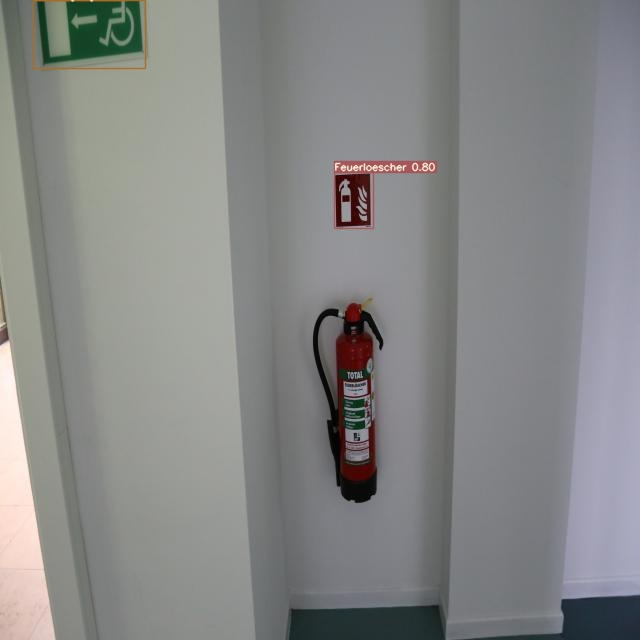



/content/yolov7/runs/detect/exp2/water_fire_de_22_jpg.rf.02427d5b653d59a5b243e69421a7b4e9.jpg


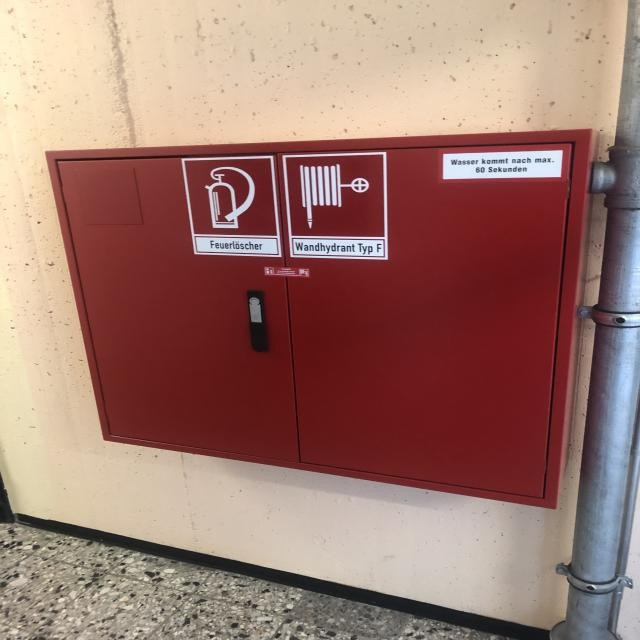



/content/yolov7/runs/detect/exp2/20210803_100656_jpg.rf.e15b045f5d025e958ef30b40f72f2653.jpg


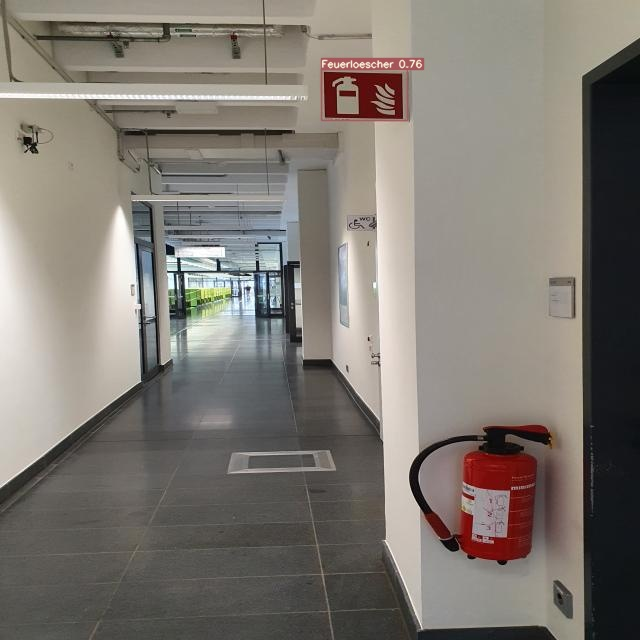



/content/yolov7/runs/detect/exp2/20210827_122649_jpg.rf.19f41529aabfd1ea3dd5e61c3a5f499d.jpg


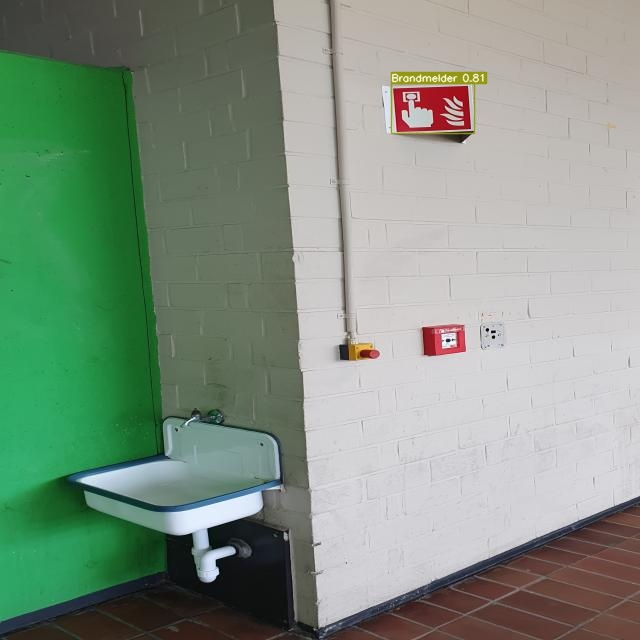



/content/yolov7/runs/detect/exp2/water_fire_de_62_jpg.rf.ec13a6a9517886794705c1ef30497b51.jpg


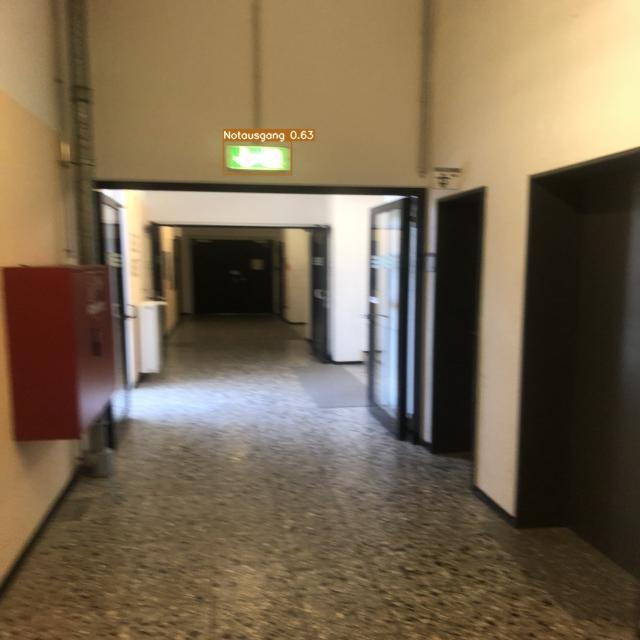



/content/yolov7/runs/detect/exp2/20210827_124446_jpg.rf.49745962905bfb02c68a405a21ba1e1b.jpg


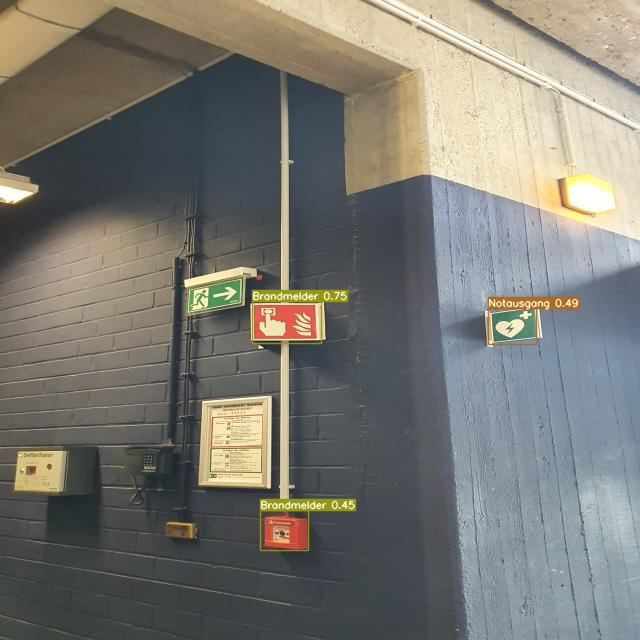



/content/yolov7/runs/detect/exp2/IMG_6176_JPG.rf.9a34d897d14e68138b646057edc4e8db.jpg


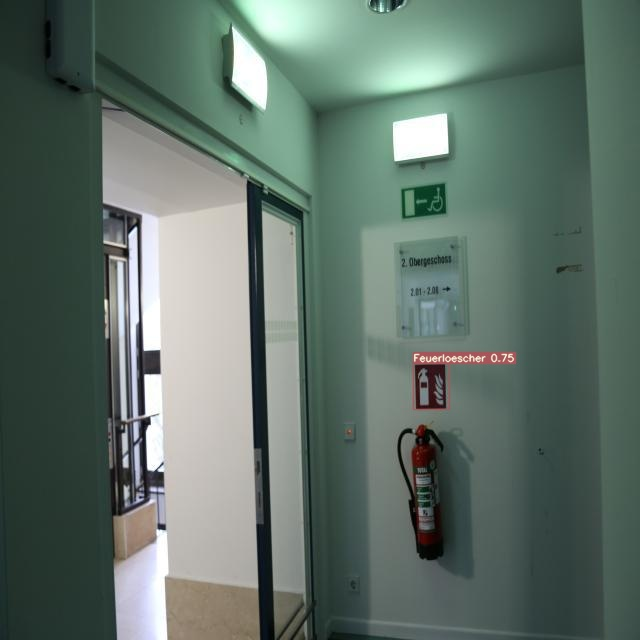



/content/yolov7/runs/detect/exp2/20210803_095715_jpg.rf.5bff96654ea53bffa4897d8926daacc2.jpg


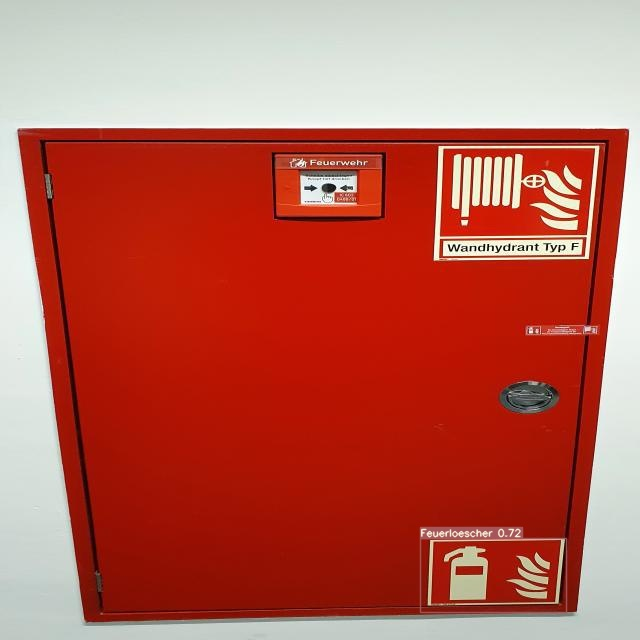



/content/yolov7/runs/detect/exp2/IMG_6110_JPG.rf.e088cc05ad22b632a4bc7fc609750a4c.jpg


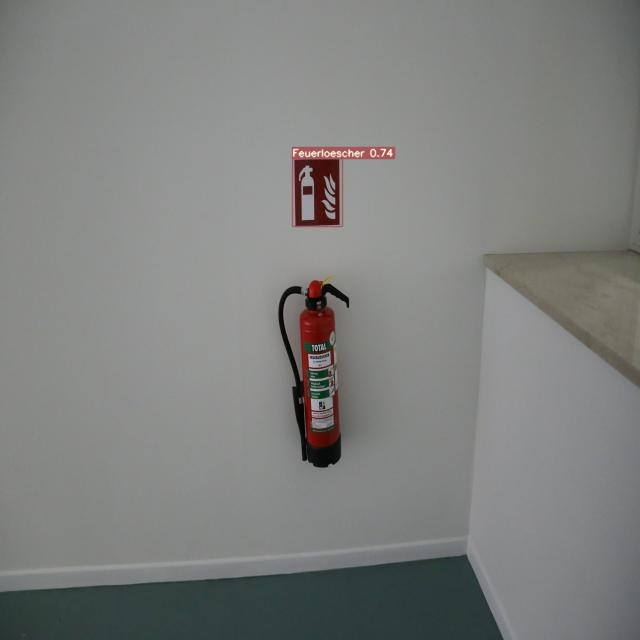

In [ ]:
#display inference on n test images

import glob

from IPython.display import Image, display


run_dir = "/content/yolov7/runs/detect/exp2/"
n = 100 # max 100 images

for imageName in glob.glob(run_dir+"*.jpg")+glob.glob(run_dir+"*.png"): #assuming JPG or PNG
    print(imageName)
    display(Image(filename=imageName))
    print("\n")
    n-=1
    if n < 0:
        break

In [ ]:
!zip -r /content/annotated.zip {run_dir}  # Zip files for easy download

updating: content/yolov7/runs/detect/exp2/ (stored 0%)
  adding: content/yolov7/runs/detect/exp2/IMG_6446_JPG.rf.689ed87fcfe26a77cb823c0e8bb605bc.jpg (deflated 11%)
  adding: content/yolov7/runs/detect/exp2/water_fire_de_22_jpg.rf.02427d5b653d59a5b243e69421a7b4e9.jpg (deflated 6%)
  adding: content/yolov7/runs/detect/exp2/20210803_100656_jpg.rf.e15b045f5d025e958ef30b40f72f2653.jpg (deflated 6%)
  adding: content/yolov7/runs/detect/exp2/20210827_122649_jpg.rf.19f41529aabfd1ea3dd5e61c3a5f499d.jpg (deflated 6%)
  adding: content/yolov7/runs/detect/exp2/water_fire_de_62_jpg.rf.ec13a6a9517886794705c1ef30497b51.jpg (deflated 6%)
  adding: content/yolov7/runs/detect/exp2/20210827_124446_jpg.rf.49745962905bfb02c68a405a21ba1e1b.jpg (deflated 5%)
  adding: content/yolov7/runs/detect/exp2/IMG_6176_JPG.rf.9a34d897d14e68138b646057edc4e8db.jpg (deflated 9%)
  adding: content/yolov7/runs/detect/exp2/20210803_095715_jpg.rf.5bff96654ea53bffa4897d8926daacc2.jpg (deflated 13%)
  adding: content/yolov7/ru

In [ ]:
!python detect.py --weights {weights} --img {image_size} --conf 0.4 --source {dataset.location}/valid/images  # Run inference on ALL validation images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/datasets/Safety-Signs-Germany-8/valid/images', update=False, view_img=False, weights=['/content/yolov7/weigths/best.pt'])
YOLOR 🚀 88fc639 torch 1.13.1+cu116 CUDA:0 (Tesla T4, 15109.875MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36514136 parameters, 6194944 gradients, 103.3 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 

/content/yolov7/runs/detect/exp6/water_fire_de_23_jpg.rf.2dae0607efdd7d7ed0c9fae7383aedf9.jpg


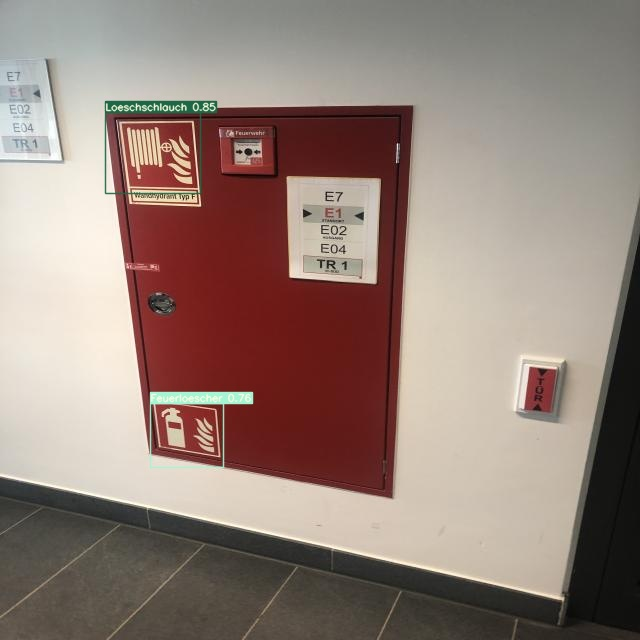



/content/yolov7/runs/detect/exp6/20210827_123525_jpg.rf.cb102e9ea810a6ee32c9d27c2fb92776.jpg


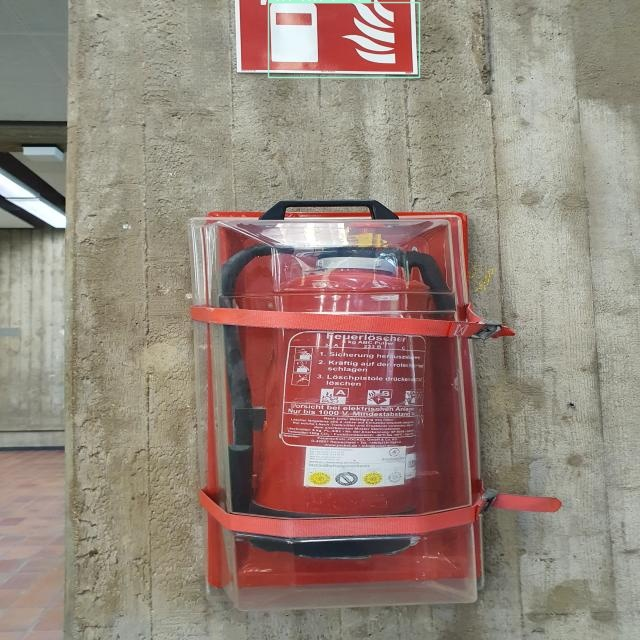



/content/yolov7/runs/detect/exp6/IMG_5636_JPG.rf.4a60b0752ea1c2a46fb82e89c76bb276.jpg


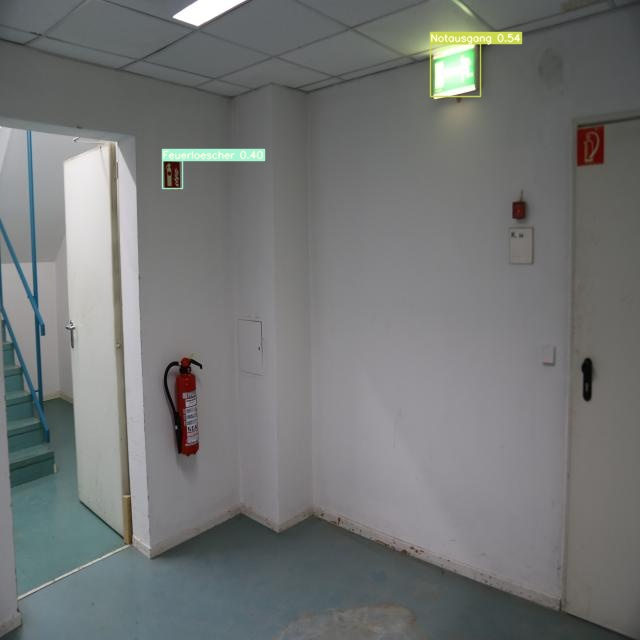



/content/yolov7/runs/detect/exp6/IMG_6104_JPG.rf.a0bb2067c7fce43f88f1d0f2ec0cfdf7.jpg


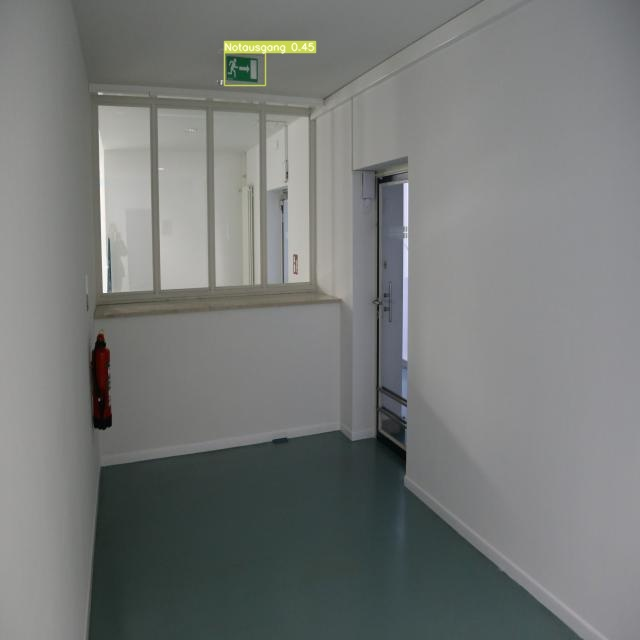



/content/yolov7/runs/detect/exp6/IMG_6163_JPG.rf.757659baf3ae2e98df89b597cb2112f3.jpg


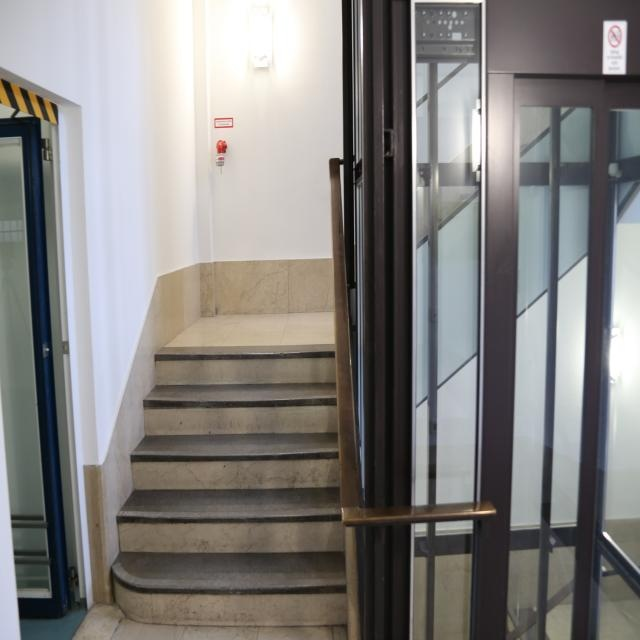



/content/yolov7/runs/detect/exp6/HHI1-112-_jpg.rf.4ea6bd1de589d064bf8c42011c1d82f6.jpg


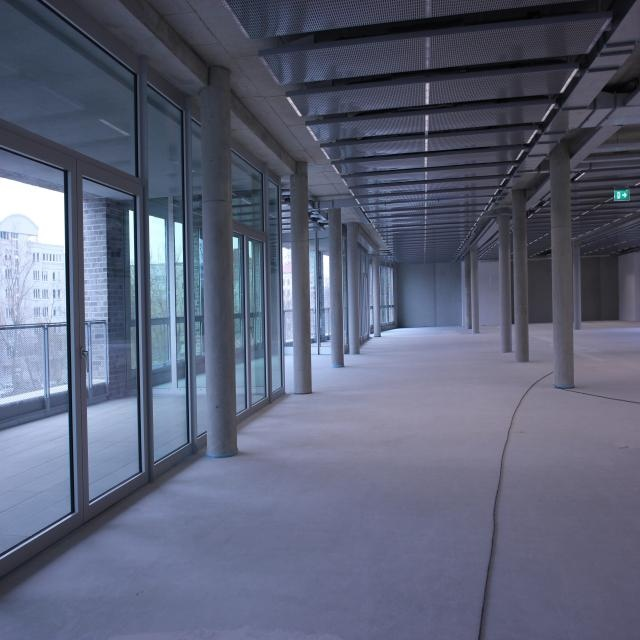



/content/yolov7/runs/detect/exp6/20211104_221556_jpg.rf.9c50ecd6ea2362900c489e98d5cc30eb.jpg


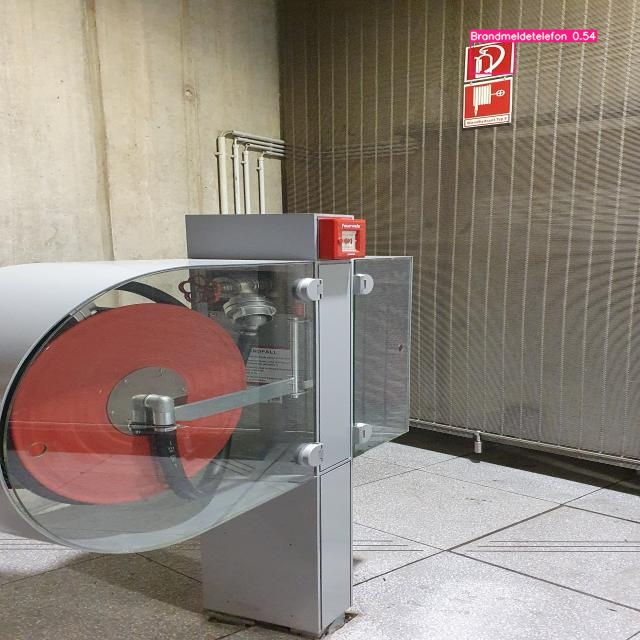



/content/yolov7/runs/detect/exp6/IMG_6112_JPG.rf.b95b5914f50245210612bb57921195de.jpg


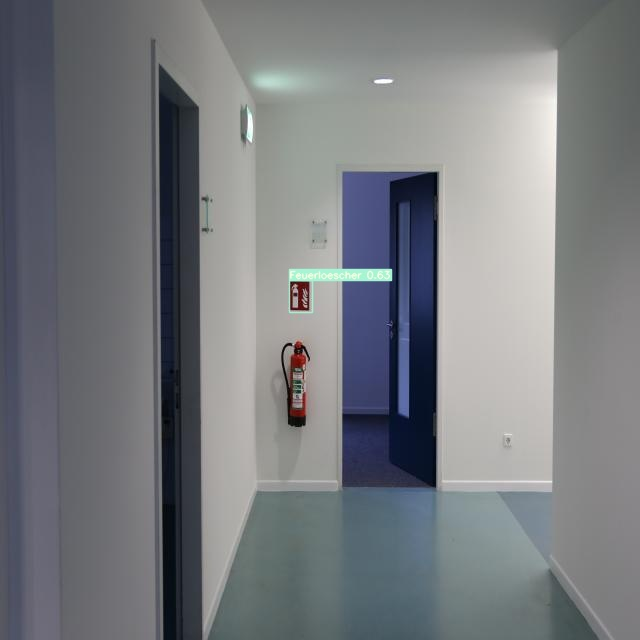



/content/yolov7/runs/detect/exp6/IMG_6316_JPG.rf.3a08d60fa7c82a8dd9b66d5dc7676ce9.jpg


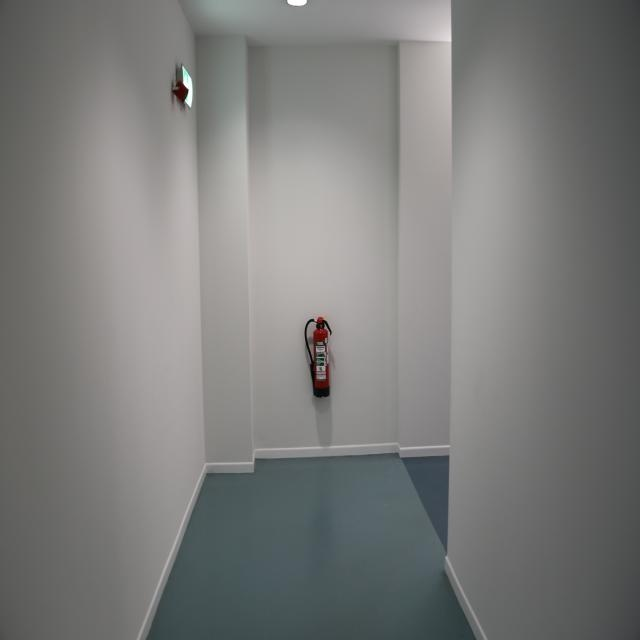



/content/yolov7/runs/detect/exp6/IMG_6106_JPG.rf.3315b5eb872c1a7ddb033f46d7431aef.jpg


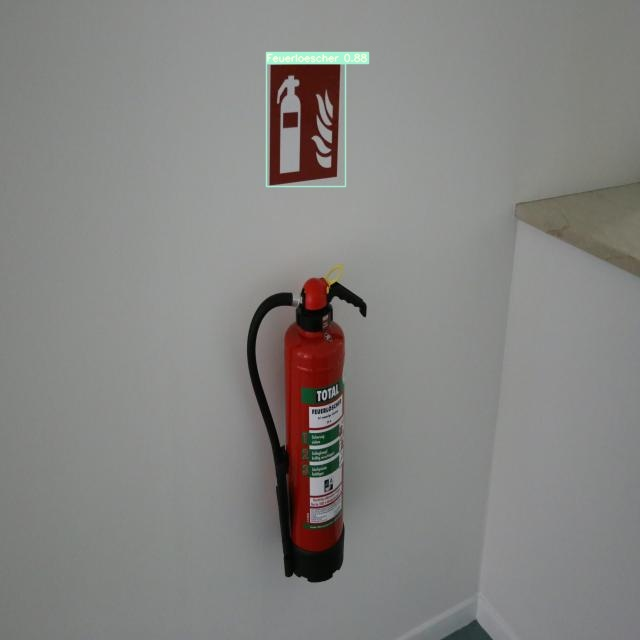



/content/yolov7/runs/detect/exp6/20210827_122714_jpg.rf.71df3fa8909e1e8357997d631aca7181.jpg


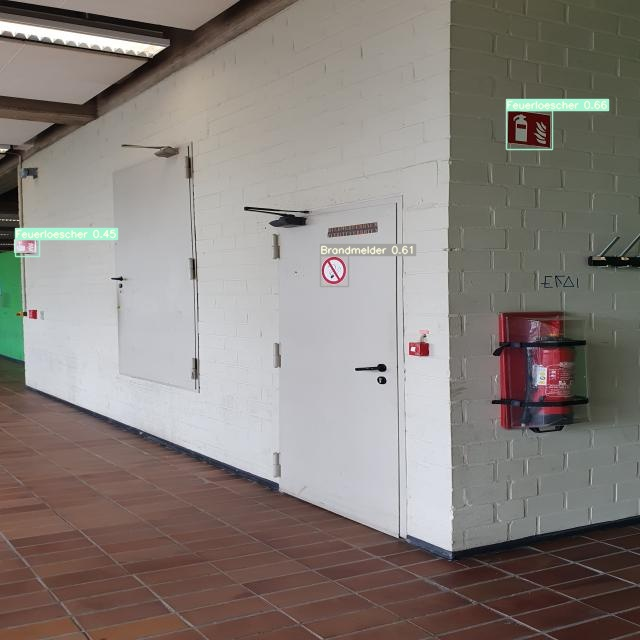



/content/yolov7/runs/detect/exp6/20210827_123708_jpg.rf.57495cfb320dacdf8aed9995410be2fe.jpg


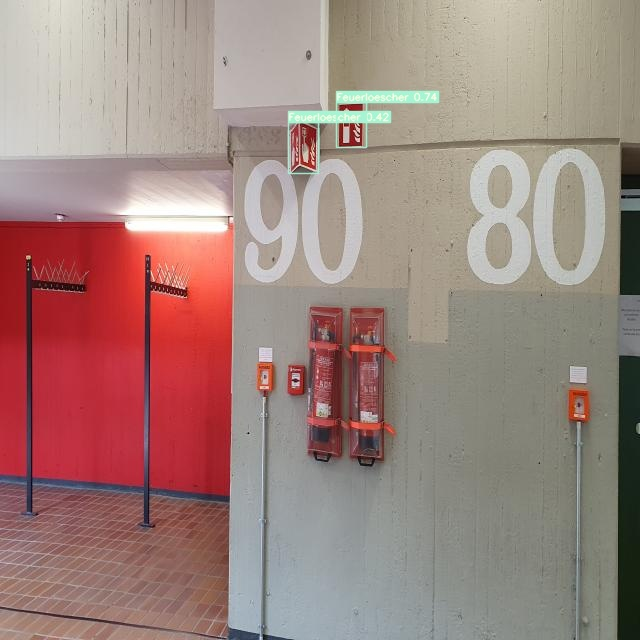



/content/yolov7/runs/detect/exp6/BIMA2-32-_png.rf.b0ce249b4e46efbc55b4e183f74be821.jpg


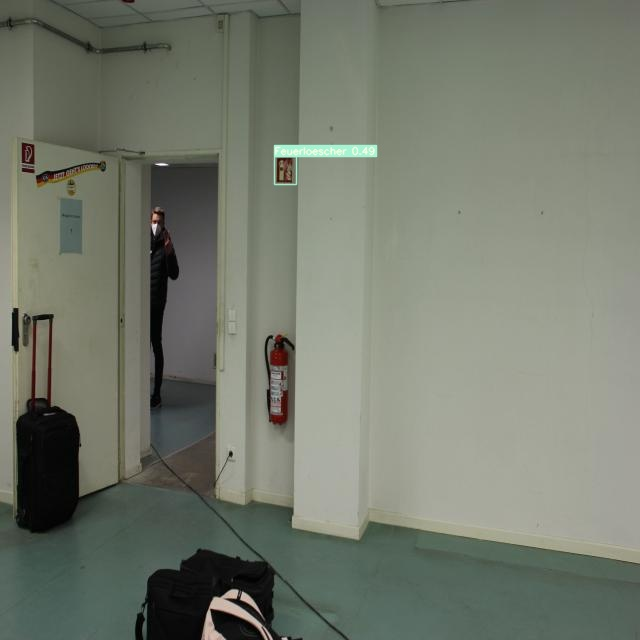



/content/yolov7/runs/detect/exp6/water_fire_de_77_jpg.rf.8286a2131093fbe2b61615353971216a.jpg


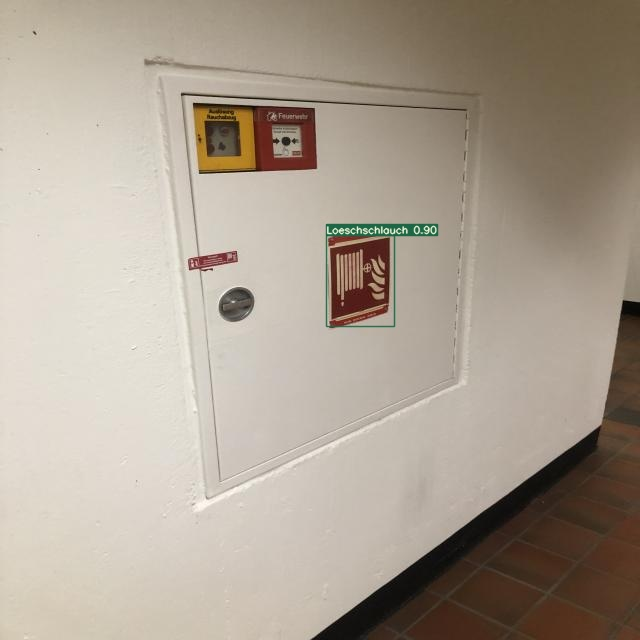



/content/yolov7/runs/detect/exp6/IMG_6149_JPG.rf.67d63e849b32828a73a7c2543e45dc43.jpg


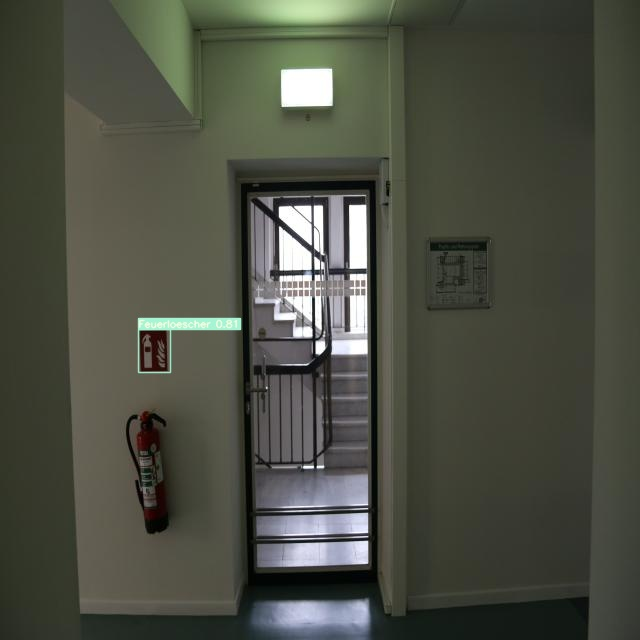



/content/yolov7/runs/detect/exp6/water_fire_de_63_jpg.rf.adbd34610d6174d9827246b550614b74.jpg


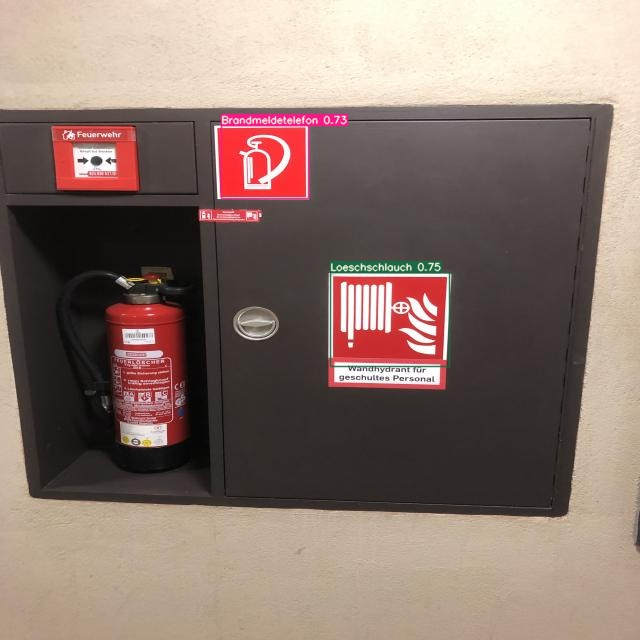



/content/yolov7/runs/detect/exp6/20210803_102557_jpg.rf.0a9159997abca216c0980cac8612d7ba.jpg


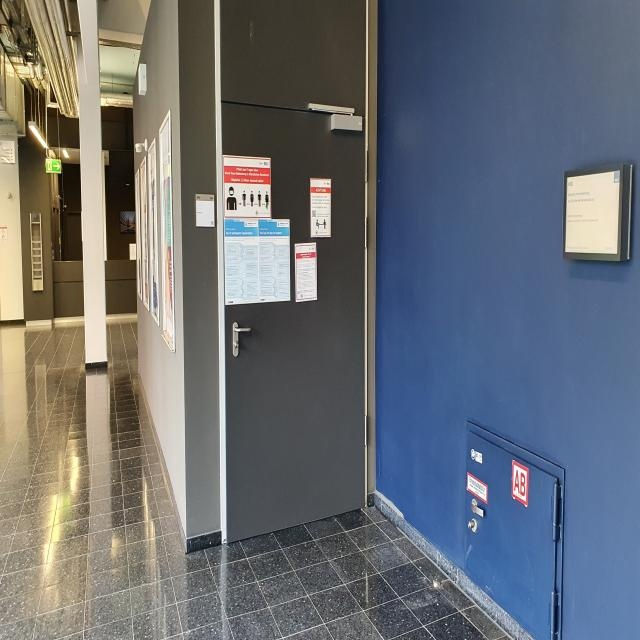



/content/yolov7/runs/detect/exp6/20211104_221502_jpg.rf.b60b5b185bb99a65b774398500dc037e.jpg


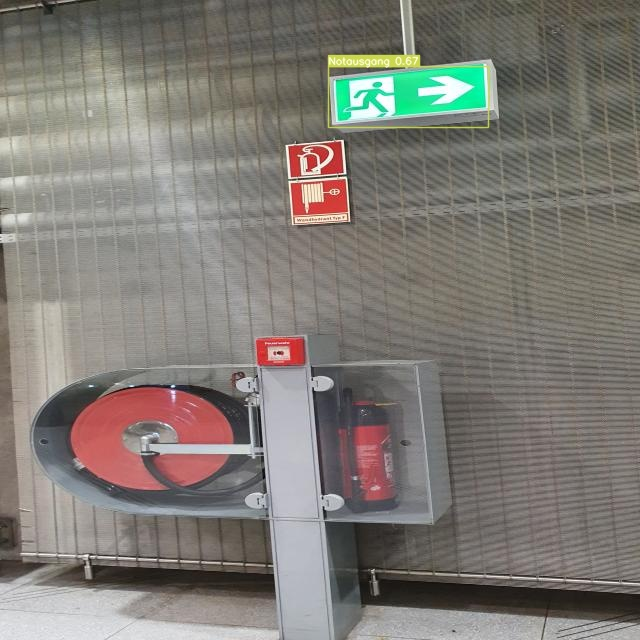



/content/yolov7/runs/detect/exp6/alarm_de_16_jpg.rf.3d8dcc589049c94207091ae7c765c023.jpg


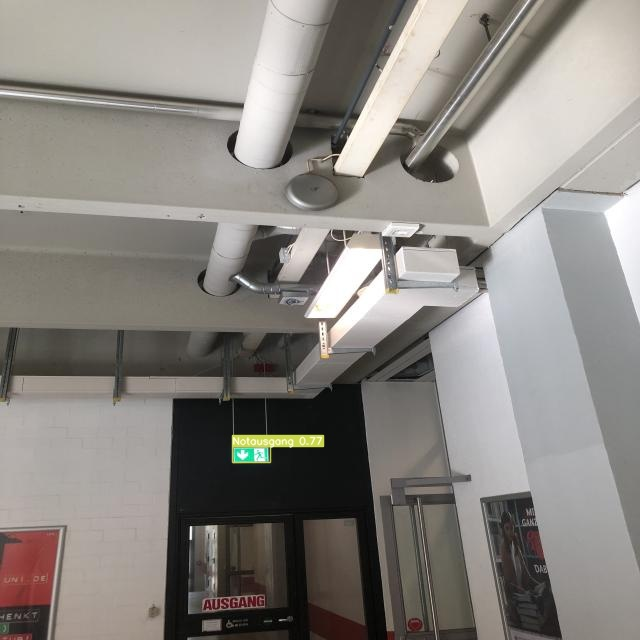



/content/yolov7/runs/detect/exp6/20210827_123231_jpg.rf.1ed5c80483a826d703f6fb3e7af72b62.jpg


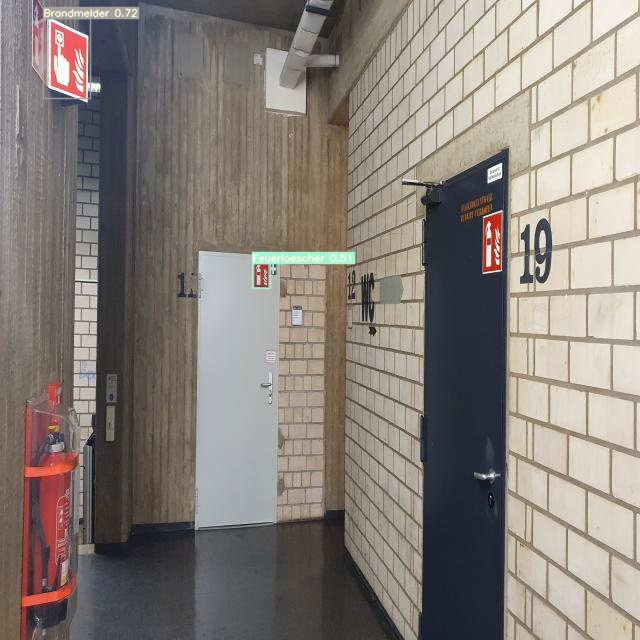



/content/yolov7/runs/detect/exp6/20210803_102936_jpg.rf.be36f55f949e48b4be1dcb7c9229197a.jpg


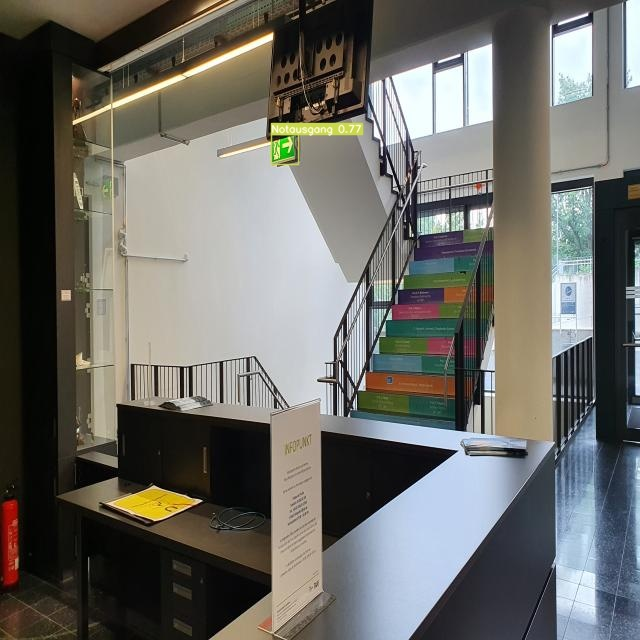



/content/yolov7/runs/detect/exp6/water_fire_de_17_jpg.rf.f0ed6ca9790305c6a6f95079d6fbfedc.jpg


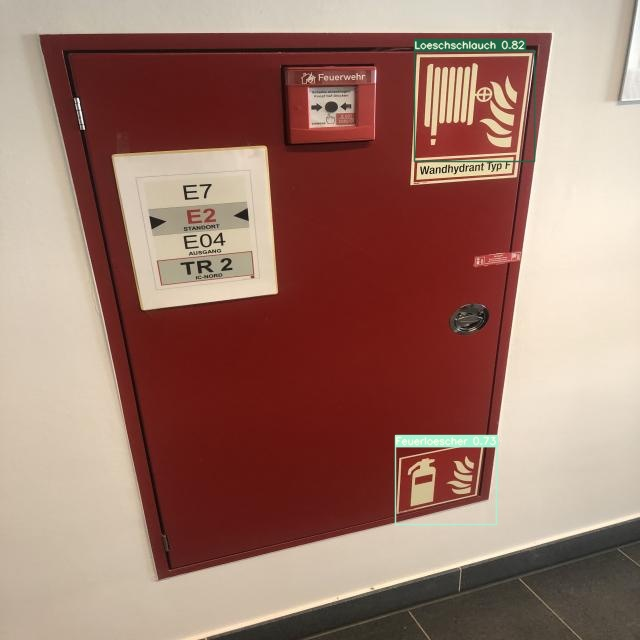



/content/yolov7/runs/detect/exp6/IMG_6218_JPG.rf.92862050403ea0a20727c8e6c5af6f59.jpg


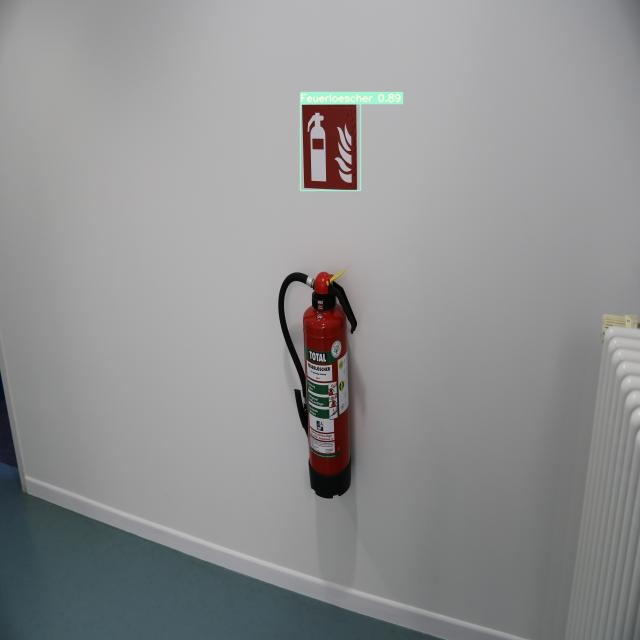



/content/yolov7/runs/detect/exp6/water_fire_de_59_jpg.rf.1ca6d55d7f2b2317d52c300477baaa2a.jpg


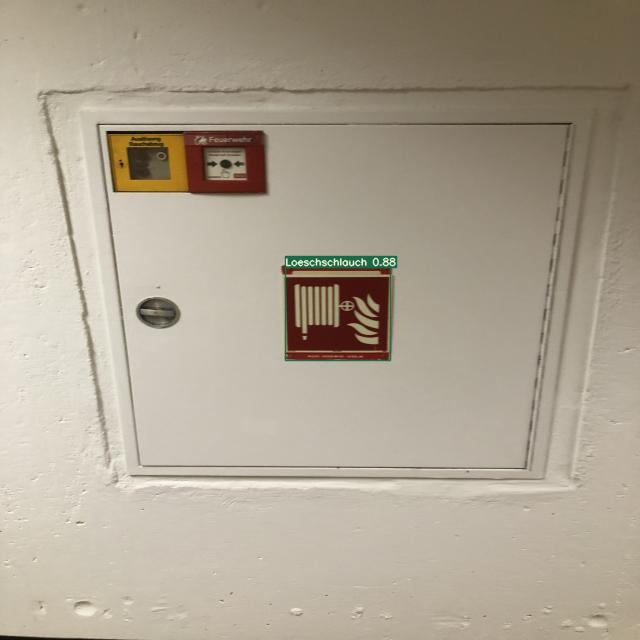



/content/yolov7/runs/detect/exp6/IMG_6132_JPG.rf.2d52880d445604fdbda0c70423679951.jpg


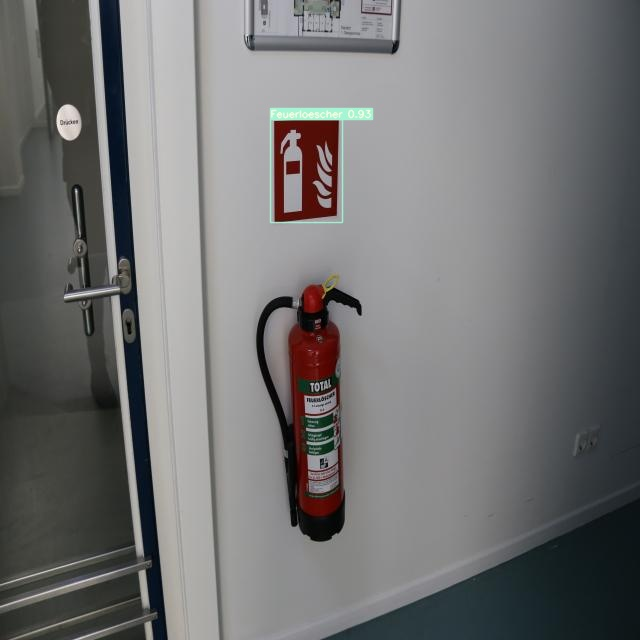



/content/yolov7/runs/detect/exp6/IMG_5673_JPG.rf.91d87764dfc7d5f4d3b3a9e1ea77b4c3.jpg


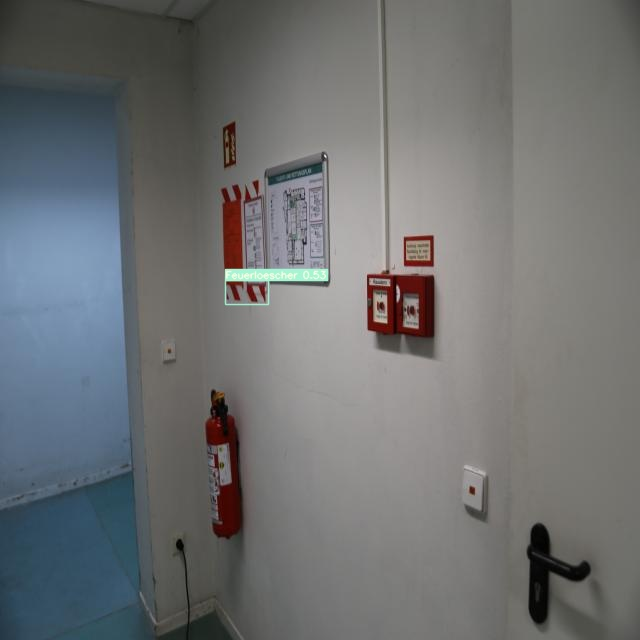



/content/yolov7/runs/detect/exp6/20210827_123934_jpg.rf.59175febee3d8c52a5a1efdf81a3340f.jpg


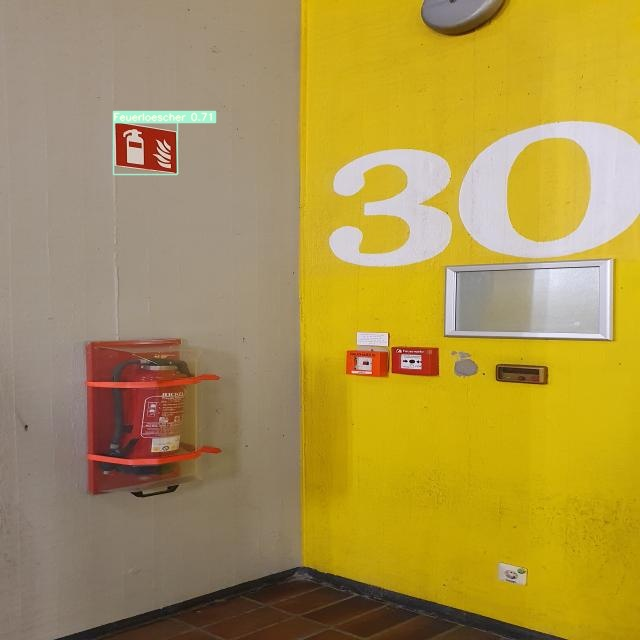



/content/yolov7/runs/detect/exp6/water_fire_de_2_jpg.rf.4ba1c5fbe5a04f6d6dcf29a09f6b7802.jpg


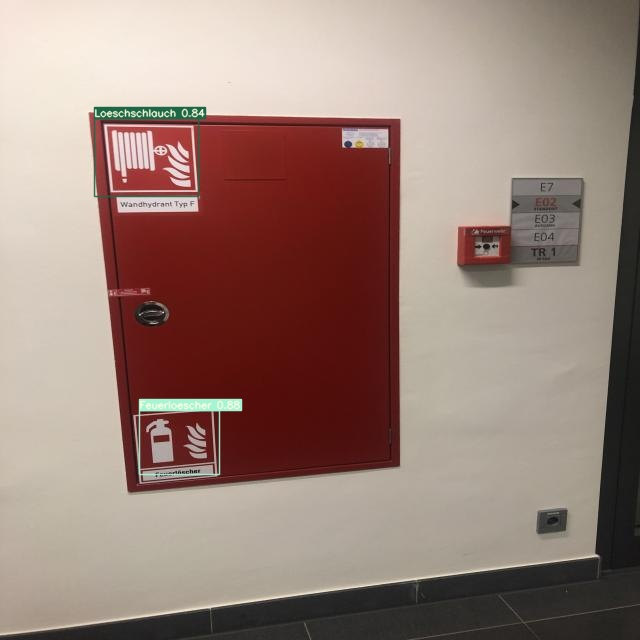



/content/yolov7/runs/detect/exp6/HHI1-136-_jpg.rf.86dc95343addab03eb1762fd1312ba03.jpg


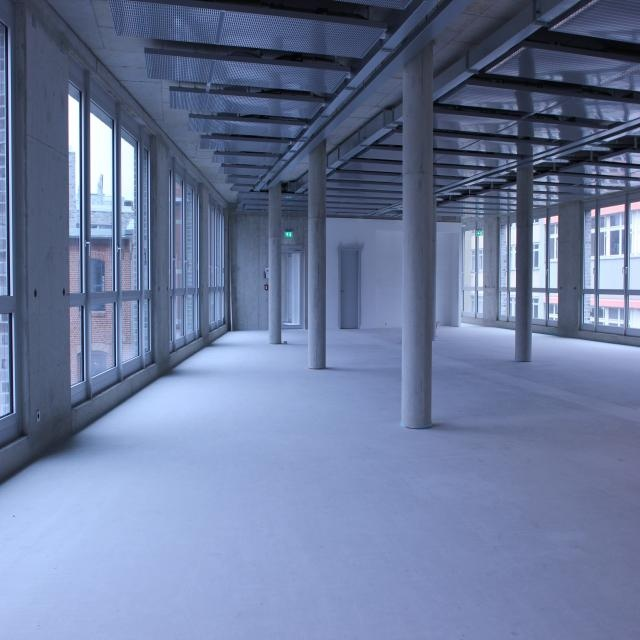



/content/yolov7/runs/detect/exp6/water_fire_de_90_jpg.rf.22f970ea3c1090912db66ec29b343044.jpg


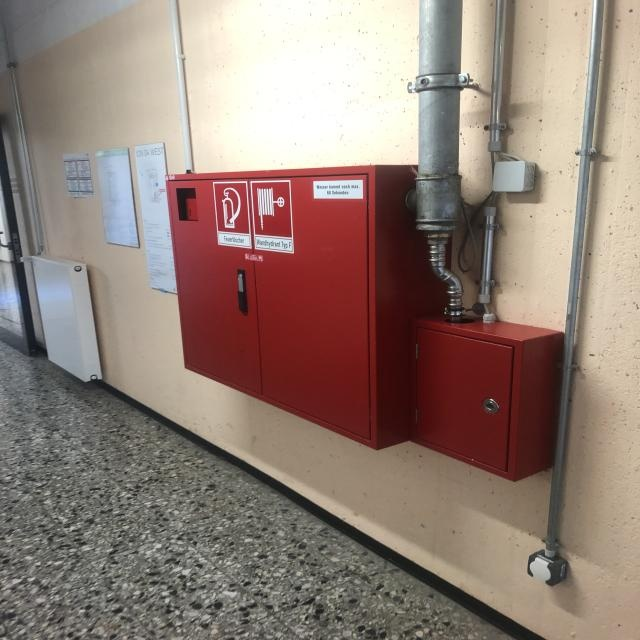



/content/yolov7/runs/detect/exp6/20210803_095933_jpg.rf.d431bc54a67aaf0f1999ba53ce037bbc.jpg


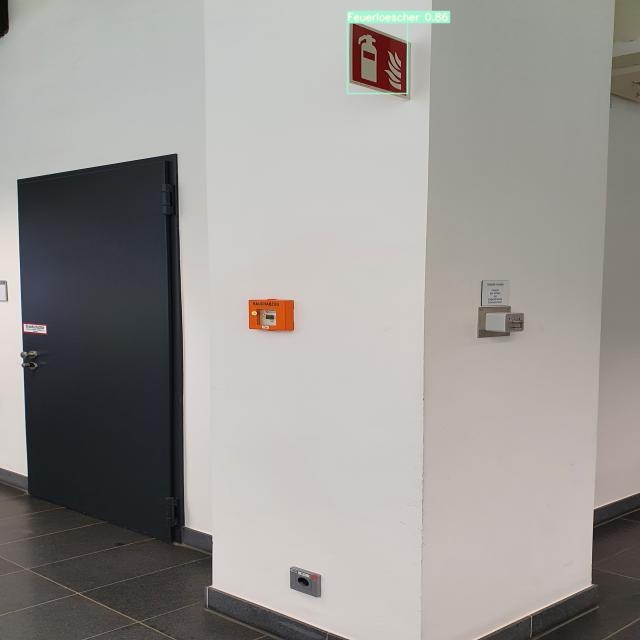



/content/yolov7/runs/detect/exp6/HHI1-159-_jpg.rf.1dec53dc990ab55d8480305ce5a5d670.jpg


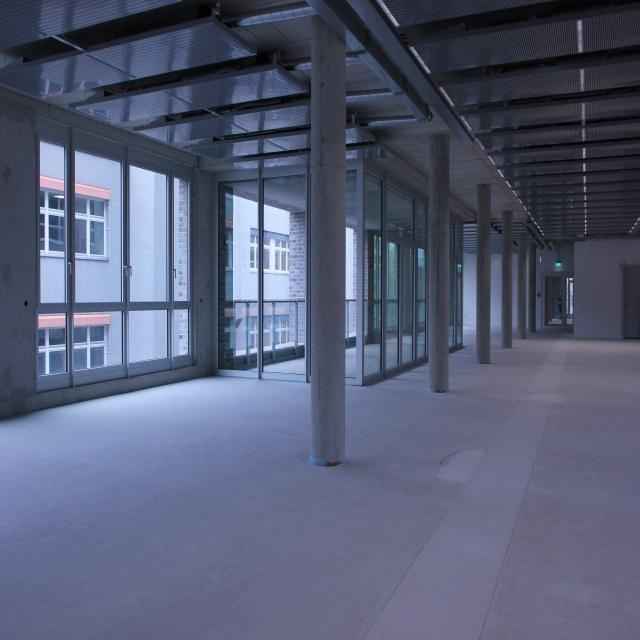



/content/yolov7/runs/detect/exp6/HHI1-131-_jpg.rf.2e06a7421ceb4cb7d5852da610441efb.jpg


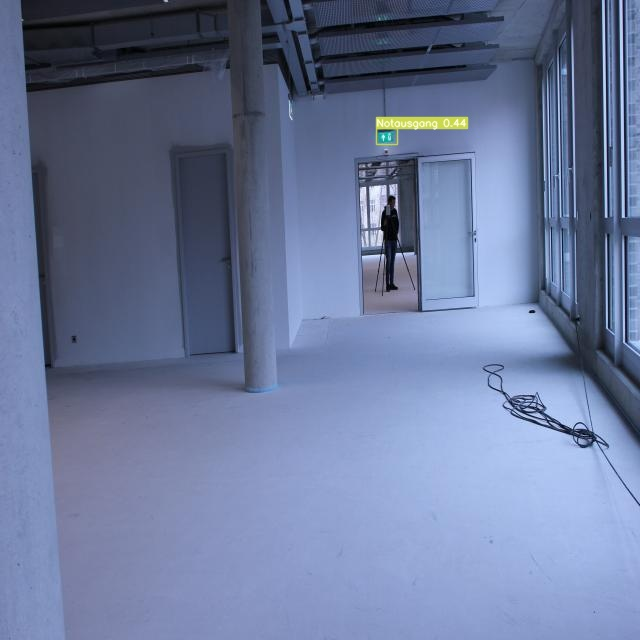



/content/yolov7/runs/detect/exp6/IMG_6384_JPG.rf.ec03af762eaed346ab67895d36fb6380.jpg


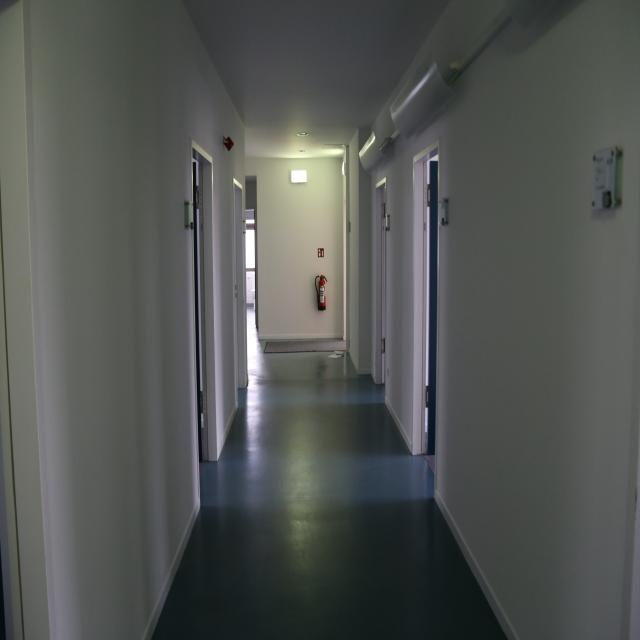



/content/yolov7/runs/detect/exp6/HHI1-133-_jpg.rf.453429ea09ec82f96904a6220725ea51.jpg


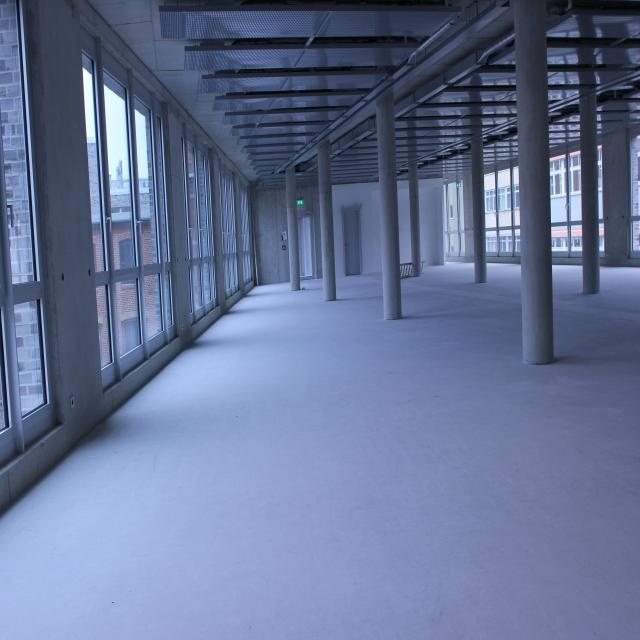



/content/yolov7/runs/detect/exp6/IMG_6385_JPG.rf.221b3379f7794cd32f620e820efcc1da.jpg


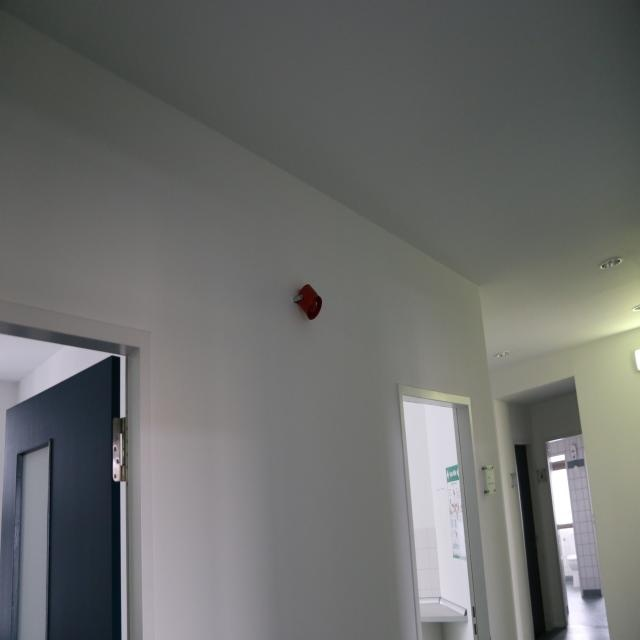



/content/yolov7/runs/detect/exp6/IMG_6431_JPG.rf.13d82bb8e7e2ace02f17eaa7d36137ac.jpg


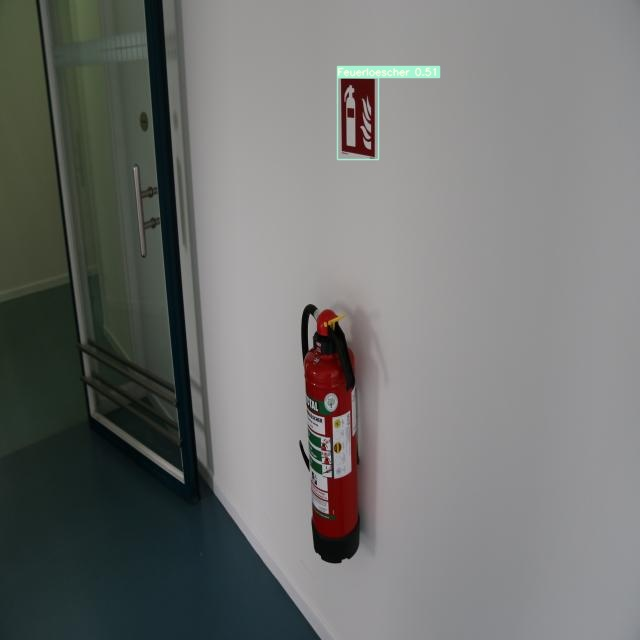



/content/yolov7/runs/detect/exp6/HHI1-175-_jpg.rf.cb61360ef07a27443933d88a04b4dd22.jpg


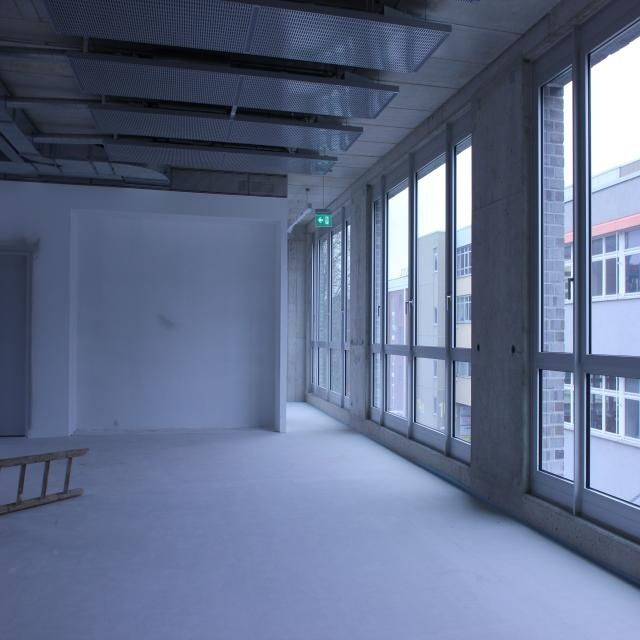



/content/yolov7/runs/detect/exp6/20210827_123619_jpg.rf.2de66236c81bd93ccaa5cf3e3f77c9cd.jpg


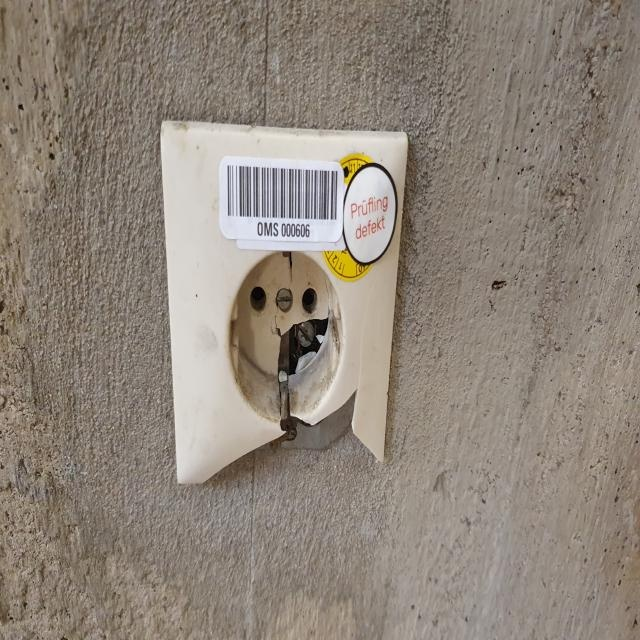



/content/yolov7/runs/detect/exp6/20210827_125457_jpg.rf.1bd8c0d2e5634cef376092bcb678a63e.jpg


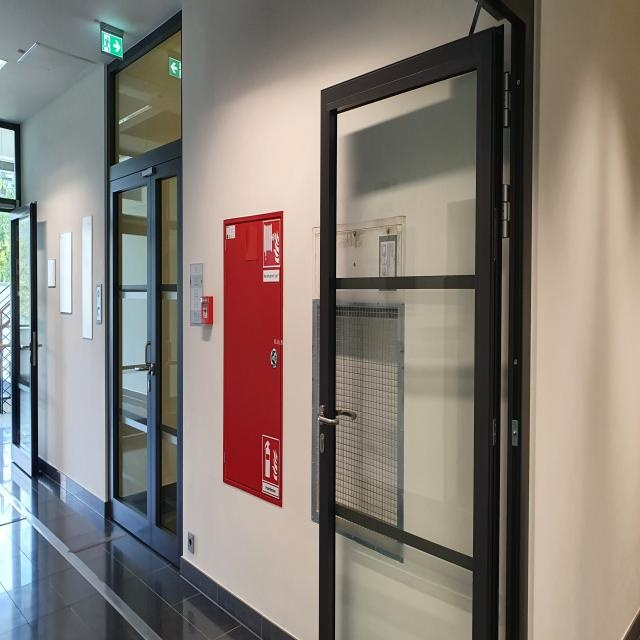



/content/yolov7/runs/detect/exp6/IMG_6425_JPG.rf.f8bfb6868c02251de37f4c82aba135c2.jpg


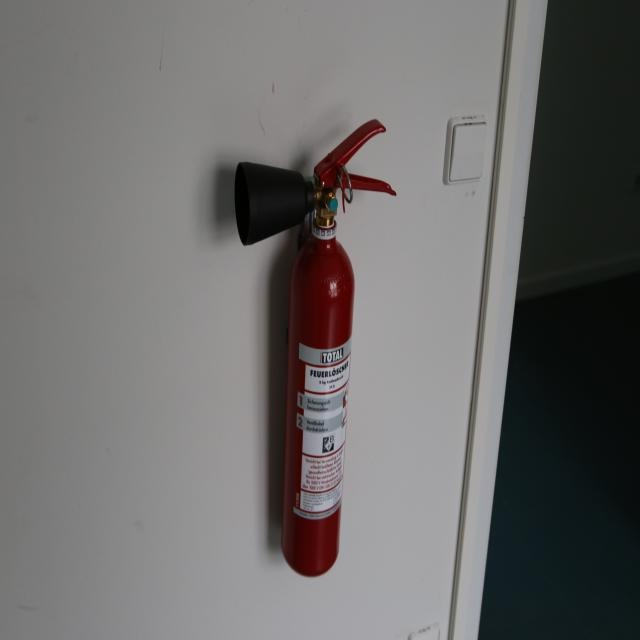



/content/yolov7/runs/detect/exp6/IMG_6205_JPG.rf.92028db95487a7f42a682254173366b1.jpg


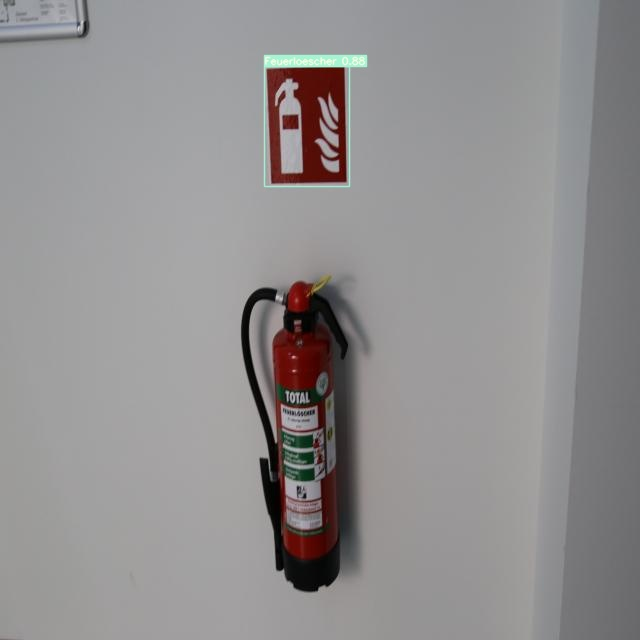



/content/yolov7/runs/detect/exp6/IMG_6334_JPG.rf.ab5076431b1a77246f7ac0119def6d9e.jpg


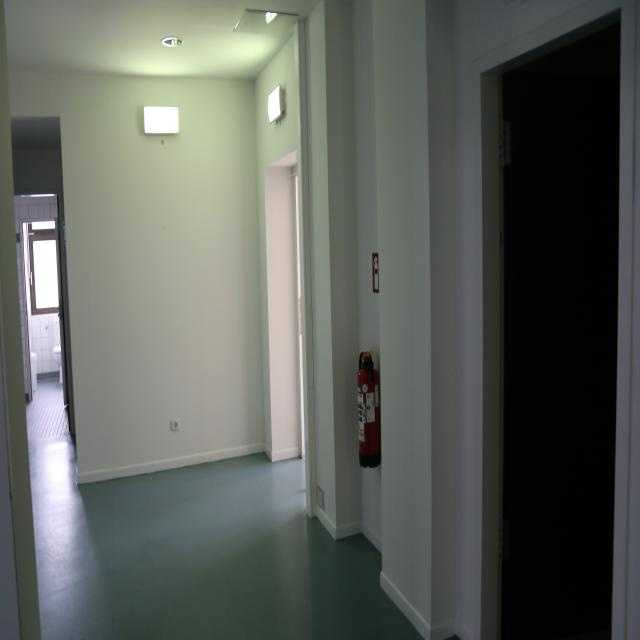



/content/yolov7/runs/detect/exp6/20210803_102407_jpg.rf.57ebfbaff3ca3936b441f56ce6462913.jpg


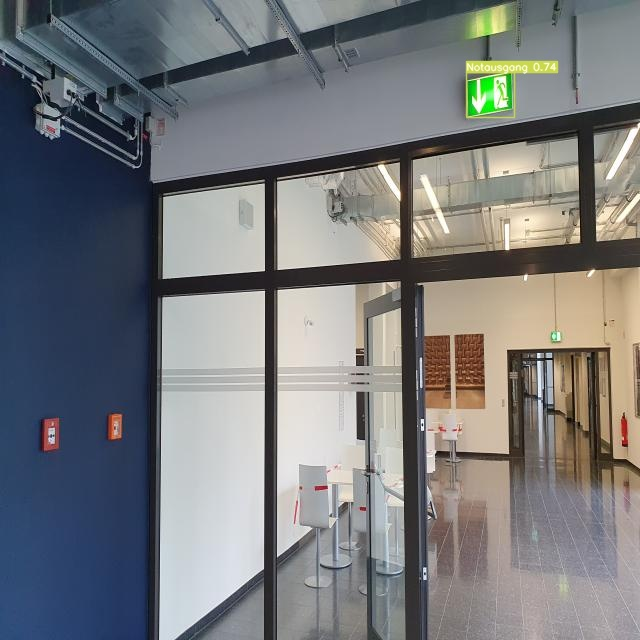



/content/yolov7/runs/detect/exp6/20210827_124454_jpg.rf.2c9bb29df6314ff7bdd4ddd586c054cf.jpg


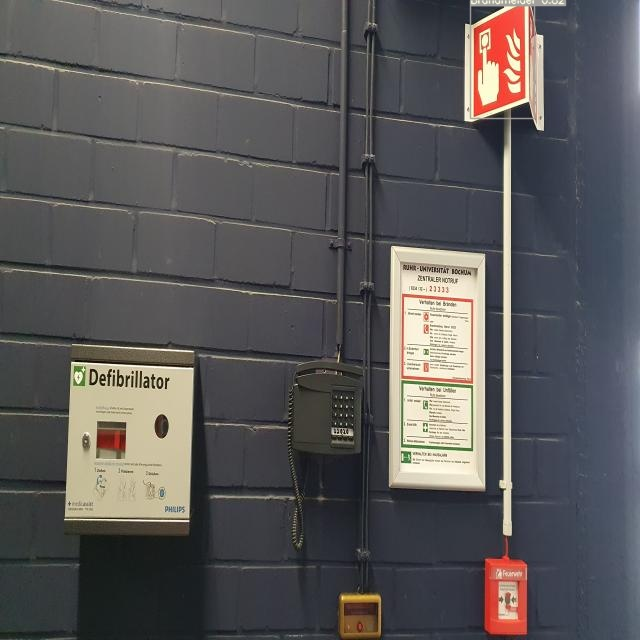



/content/yolov7/runs/detect/exp6/IMG_6197_JPG.rf.e0f8195b03236974d01e4cd812b00c15.jpg


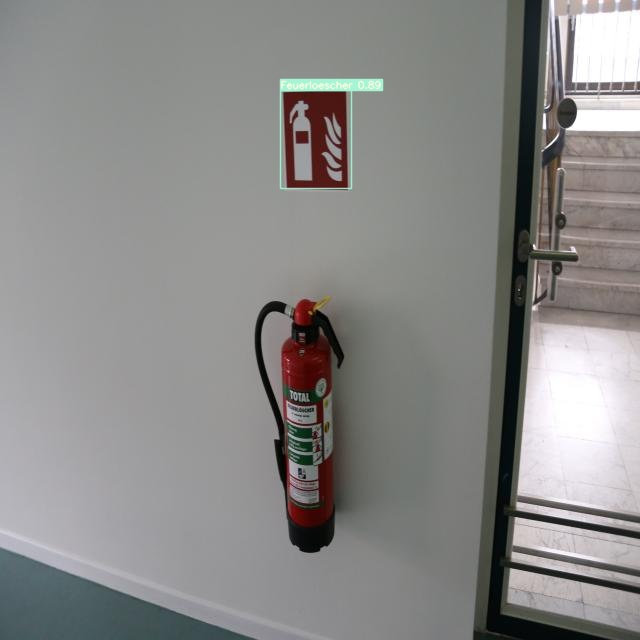



/content/yolov7/runs/detect/exp6/IMG_5789_JPG.rf.bee460f6bdf0dff39c6fb57563090229.jpg


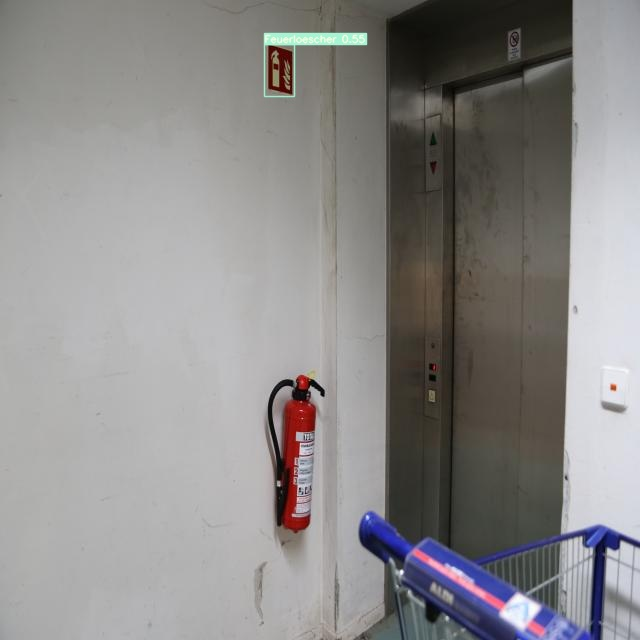



/content/yolov7/runs/detect/exp6/foam_fire_de_100_jpg.rf.8f43623d08cbfcba3221aeebb6c6c0f1.jpg


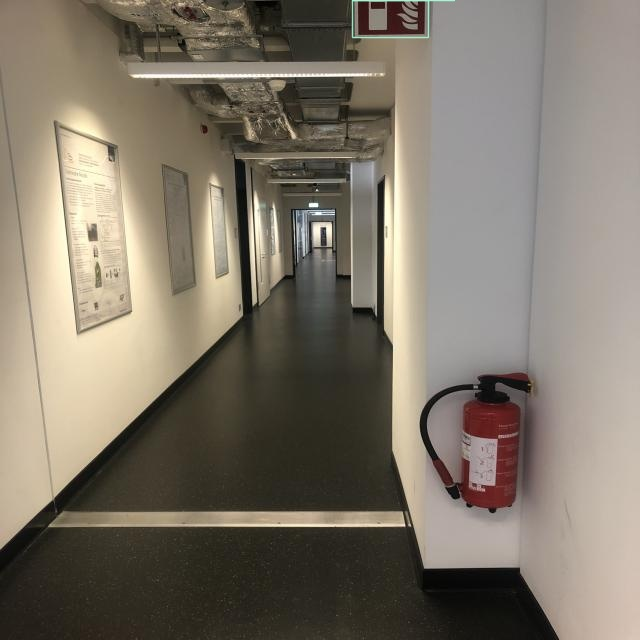



/content/yolov7/runs/detect/exp6/IMG_6107_JPG.rf.afaf03a43d9477624c1fef631fd0ea29.jpg


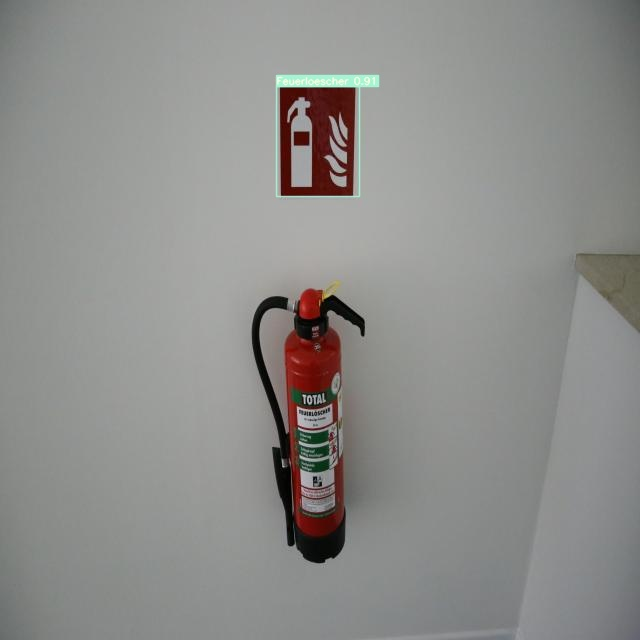



/content/yolov7/runs/detect/exp6/IMG_6217_JPG.rf.28c37c0e9498a7c7ea667825afbdb451.jpg


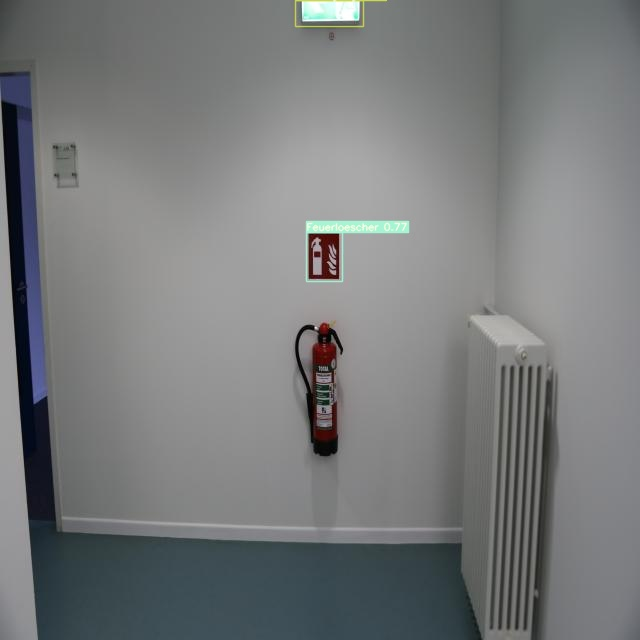



/content/yolov7/runs/detect/exp6/HHI1-105-_jpg.rf.1a0d1b119b25ab34f3a53891cdbb7574.jpg


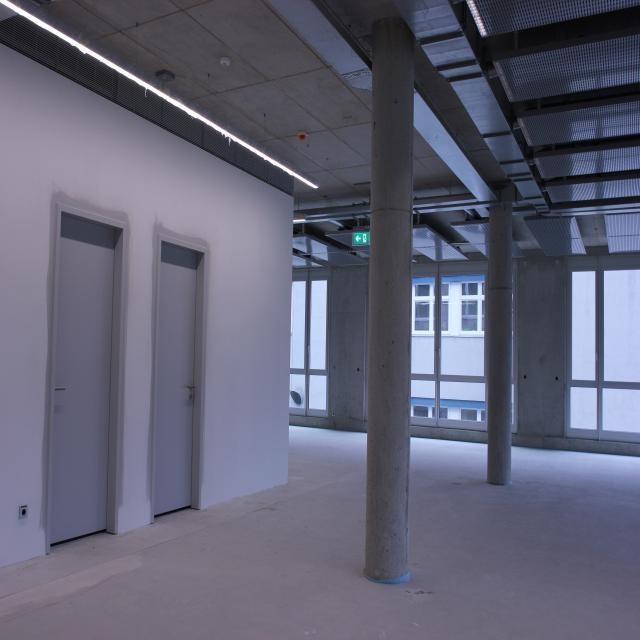



/content/yolov7/runs/detect/exp6/HHI1-127-_jpg.rf.6351359314aa63f72aad3e666cfe6fbb.jpg


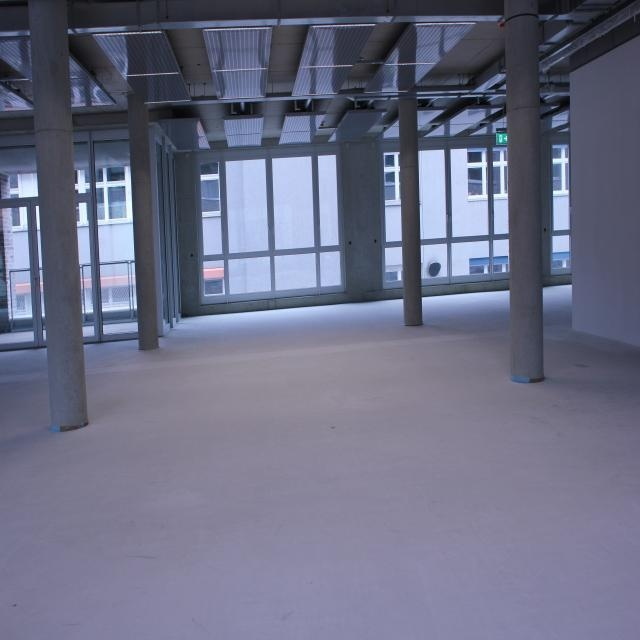



/content/yolov7/runs/detect/exp6/water_fire_de_61_jpg.rf.e7e123bd8cb3fe088a787daa5a6a6f8f.jpg


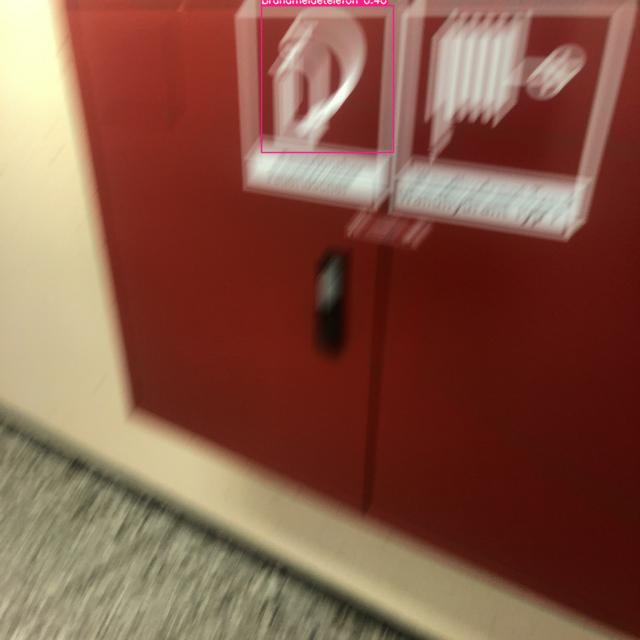



/content/yolov7/runs/detect/exp6/HHI1-156-_jpg.rf.462af55342a03480b8df42af7e8239db.jpg


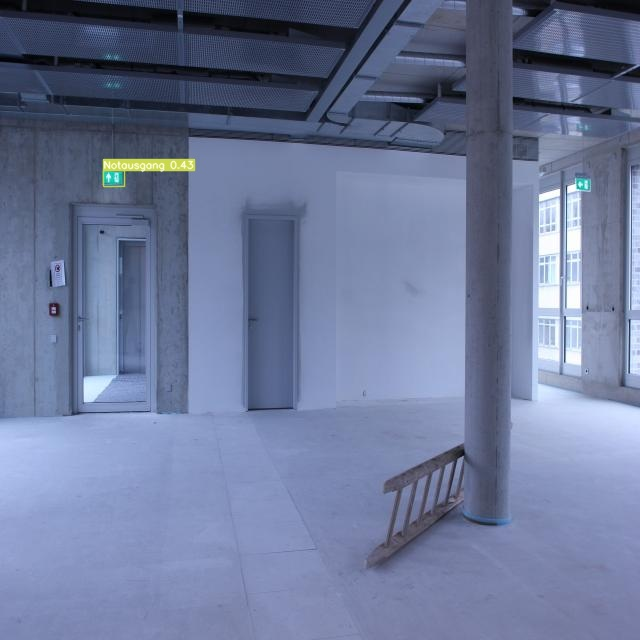



/content/yolov7/runs/detect/exp6/20210902_180255_jpg.rf.04eef74e16febd4aef4397ccabd61aea.jpg


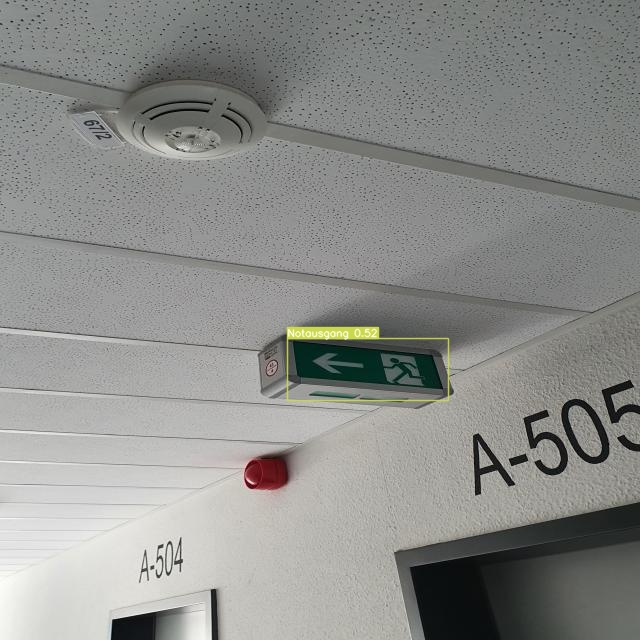



/content/yolov7/runs/detect/exp6/HHI1-238-_jpg.rf.254346b49122f0b97f9ba8242682363b.jpg


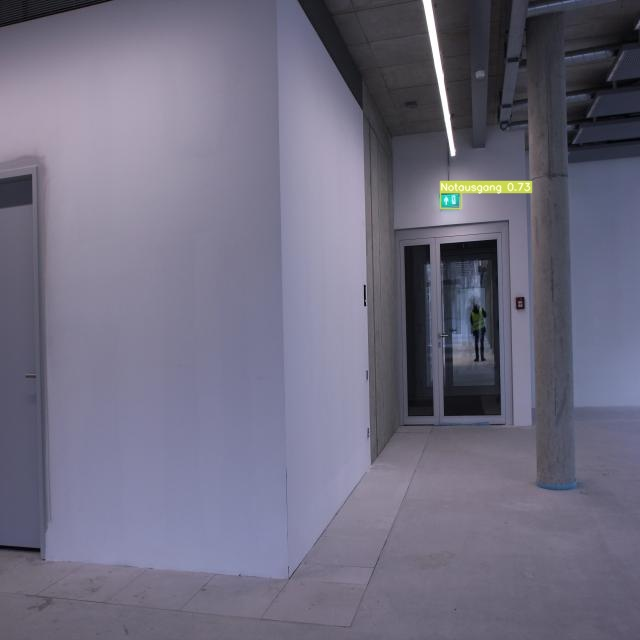



/content/yolov7/runs/detect/exp6/IMG_6151_JPG.rf.976814411ff788488429bb692c010d58.jpg


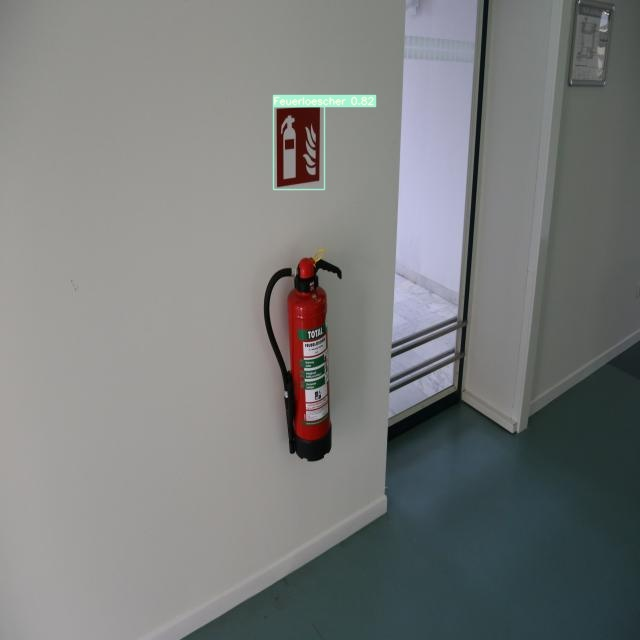



/content/yolov7/runs/detect/exp6/20210803_100656_jpg.rf.e15b045f5d025e958ef30b40f72f2653.jpg


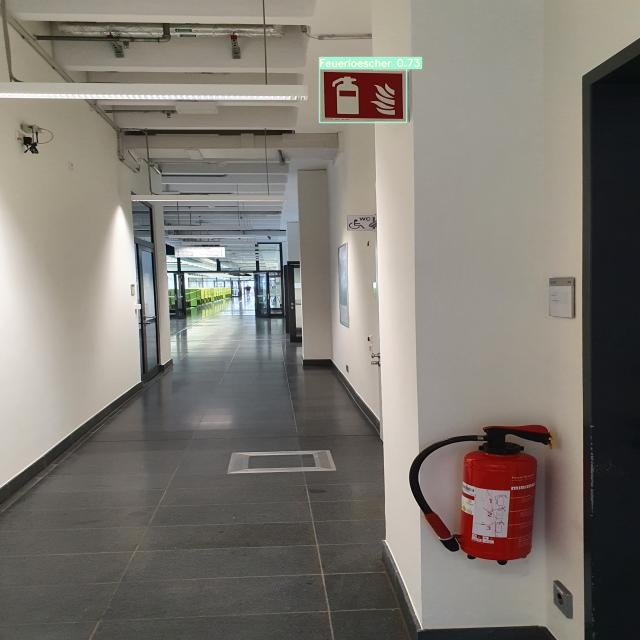



/content/yolov7/runs/detect/exp6/water_fire_de_85_jpg.rf.f2f6502e3998ed434477a39027ffd0b3.jpg


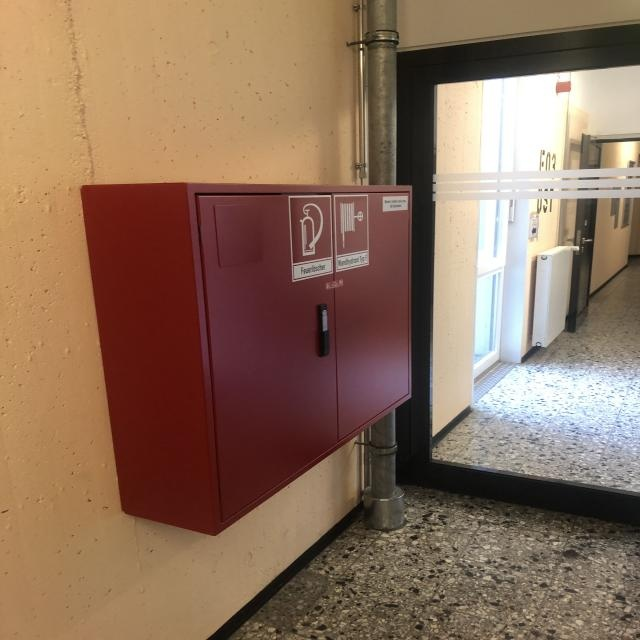



/content/yolov7/runs/detect/exp6/IMG_6375_JPG.rf.cd79ac0965f5d3e077bc71314cee4a28.jpg


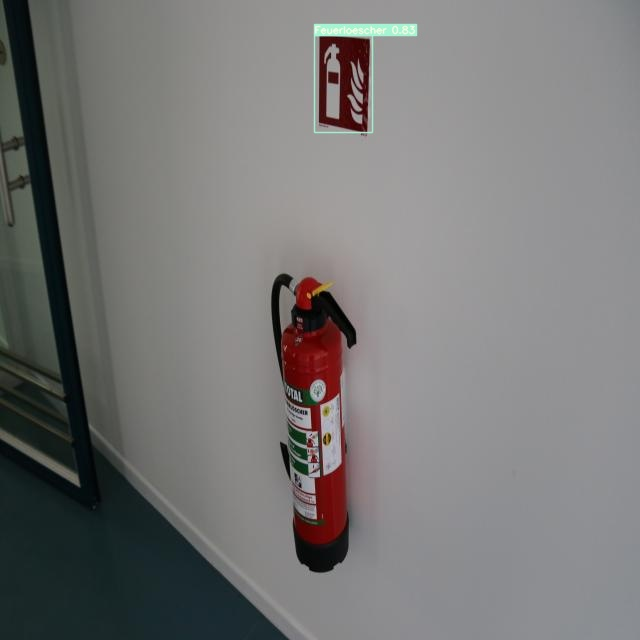



/content/yolov7/runs/detect/exp6/IMG_6432_JPG.rf.362a1d4bcc8f32e2bf135c0eb171feca.jpg


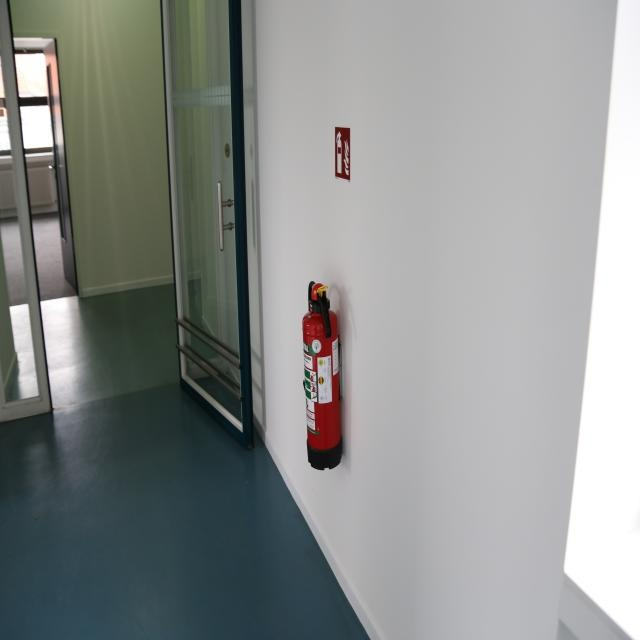



/content/yolov7/runs/detect/exp6/20210803_102221_jpg.rf.8c46e9d367cb22ae7918be18869862e5.jpg


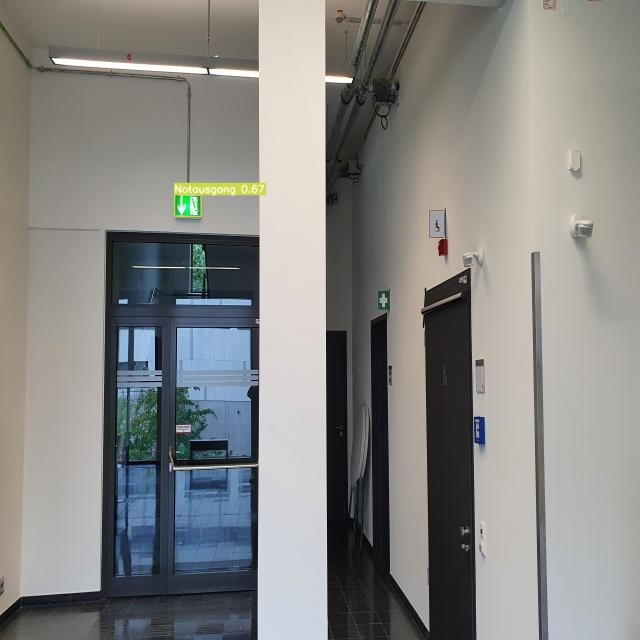



/content/yolov7/runs/detect/exp6/IMG_6321_JPG.rf.155156a515755cefa6e516f703b01d2d.jpg


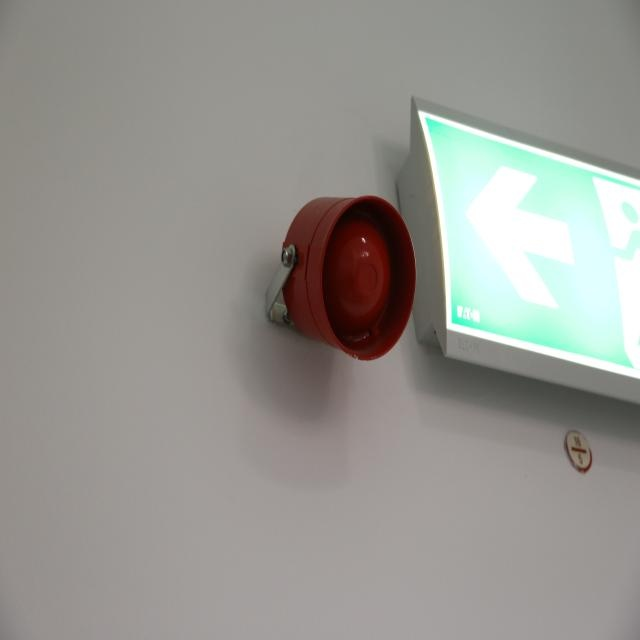



/content/yolov7/runs/detect/exp6/20210902_175556_jpg.rf.78260fd54e8f2806e230494fc3c28e5e.jpg


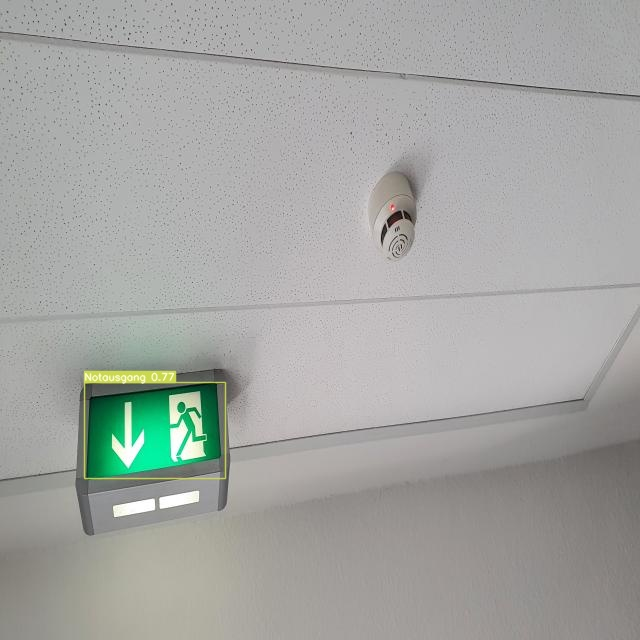



/content/yolov7/runs/detect/exp6/HHI1-111-_jpg.rf.0175568592bc9b3bf5a5b68c7512ffb3.jpg


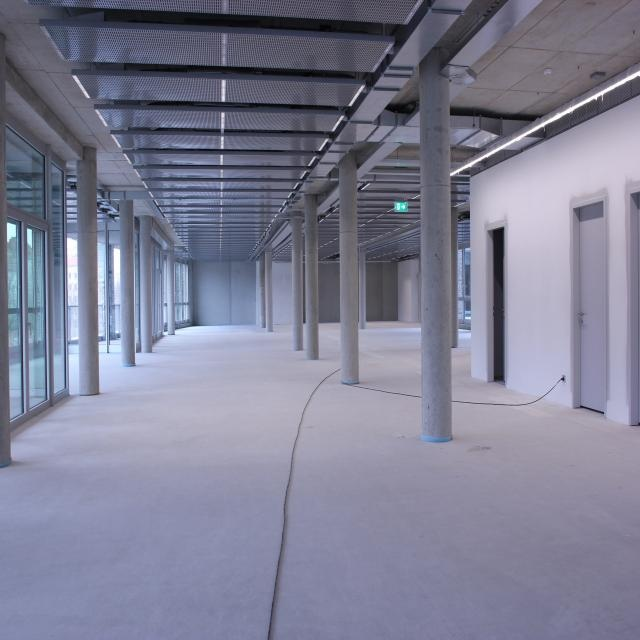



/content/yolov7/runs/detect/exp6/20210803_102856_jpg.rf.8561dcfc7956ec52311dbfa396482176.jpg


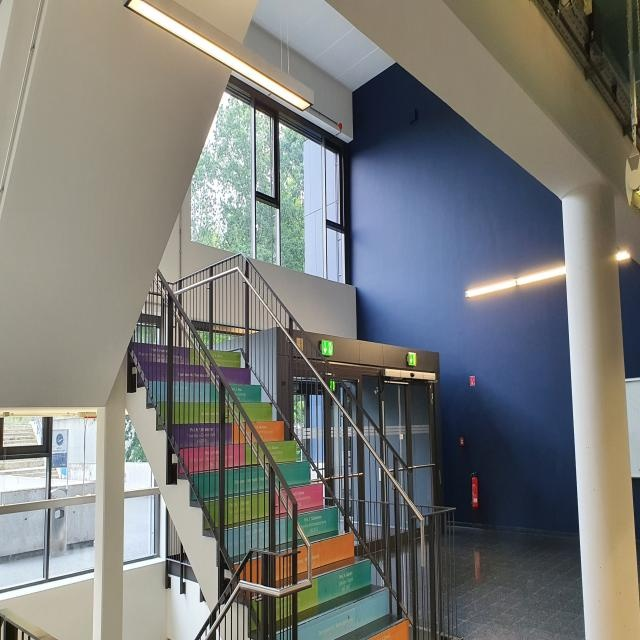



/content/yolov7/runs/detect/exp6/HHI1-110-_jpg.rf.323820acb4247b62f1548e8f68dd7f28.jpg


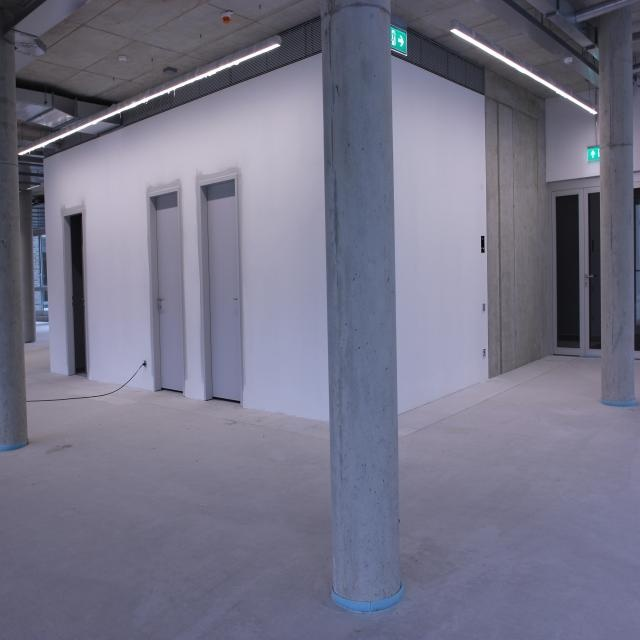



/content/yolov7/runs/detect/exp6/IMG_6202_JPG.rf.3fcf7c015801084fb725e0eaeacbc2b2.jpg


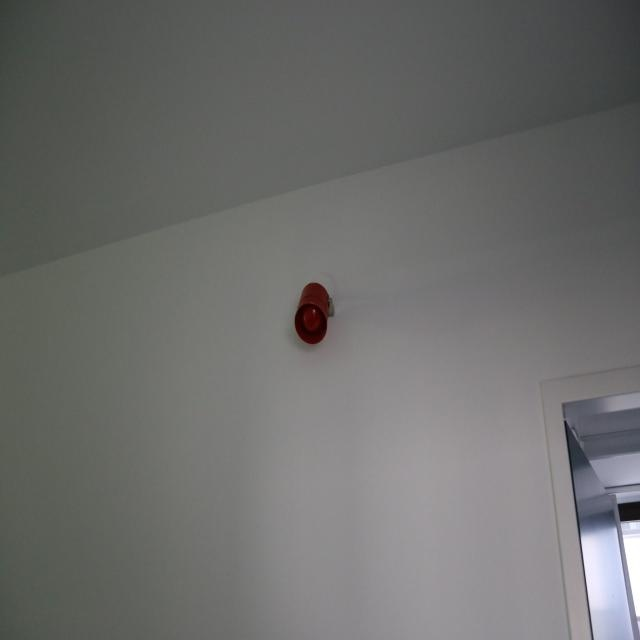



/content/yolov7/runs/detect/exp6/IMG_6289_JPG.rf.418e97caca326c3f9123afa112755627.jpg


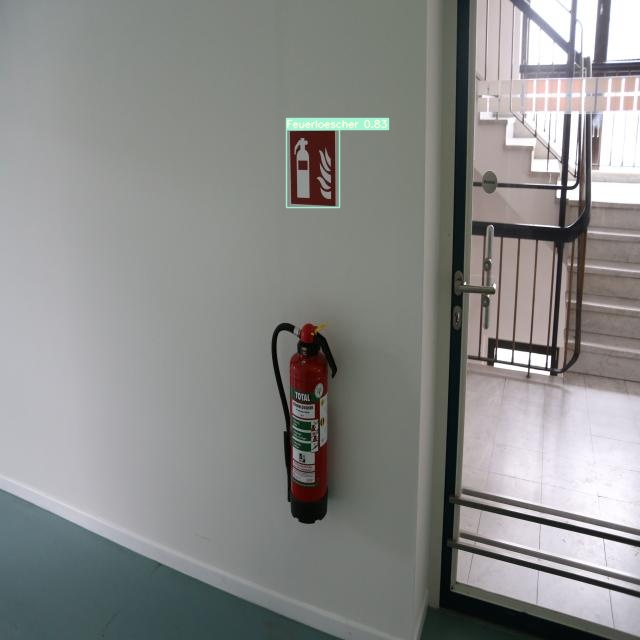



/content/yolov7/runs/detect/exp6/IMG_6266_JPG.rf.a0f060f2200f56bd04c1ac64c7409c18.jpg


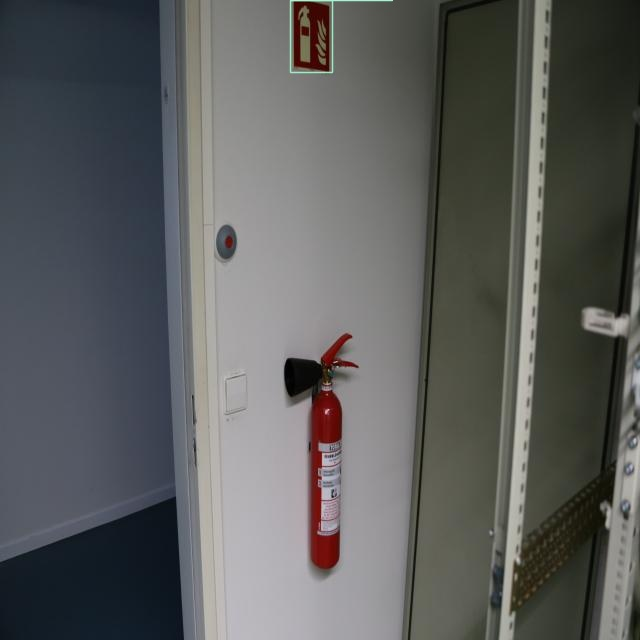



/content/yolov7/runs/detect/exp6/IMG_6318_JPG.rf.e6d5680a18ff8de275133289375e7ce2.jpg


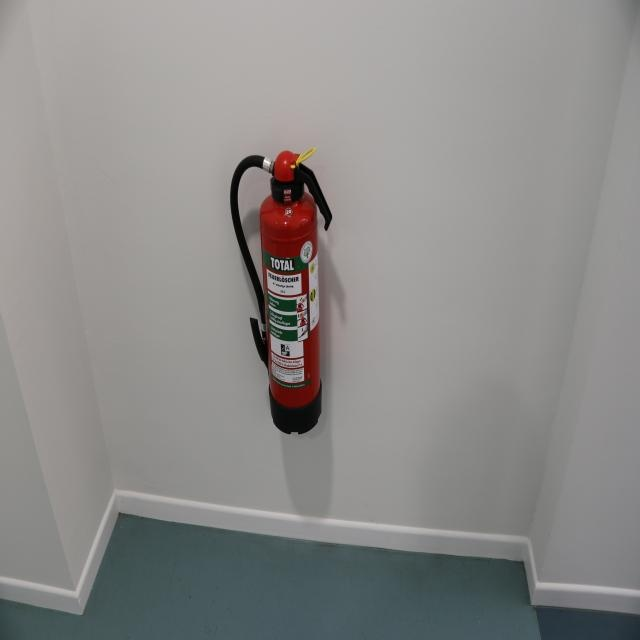



/content/yolov7/runs/detect/exp6/Image_20220113-124148_jpg.rf.2577aa02b2af020f1a599b153de066e4.jpg


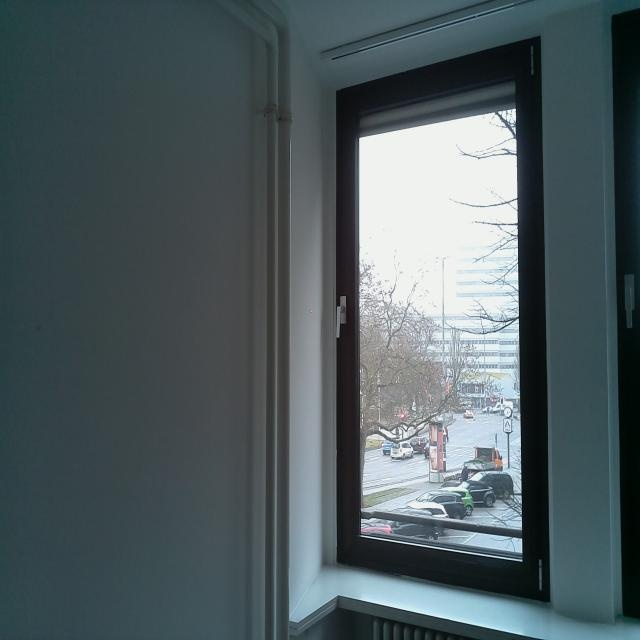



/content/yolov7/runs/detect/exp6/20210827_125047_jpg.rf.6775c4b9daa58ec5c19d9017c3d313f7.jpg


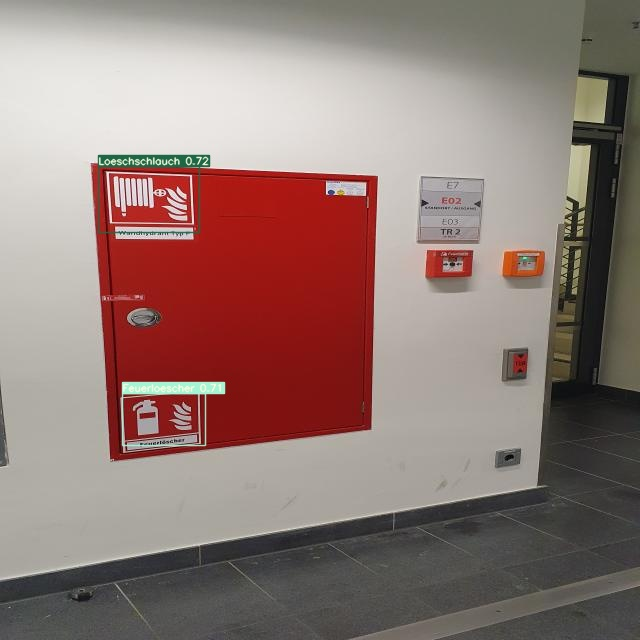



/content/yolov7/runs/detect/exp6/HHI1-194-_jpg.rf.0a6d5dc5d3e09e74471915c1759c6089.jpg


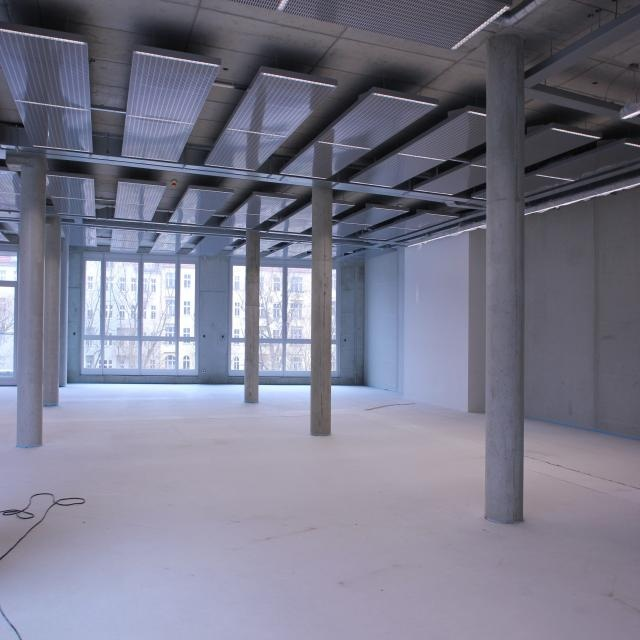



/content/yolov7/runs/detect/exp6/IMG_6212_JPG.rf.79c88ef9349c92365712ad2a40010798.jpg


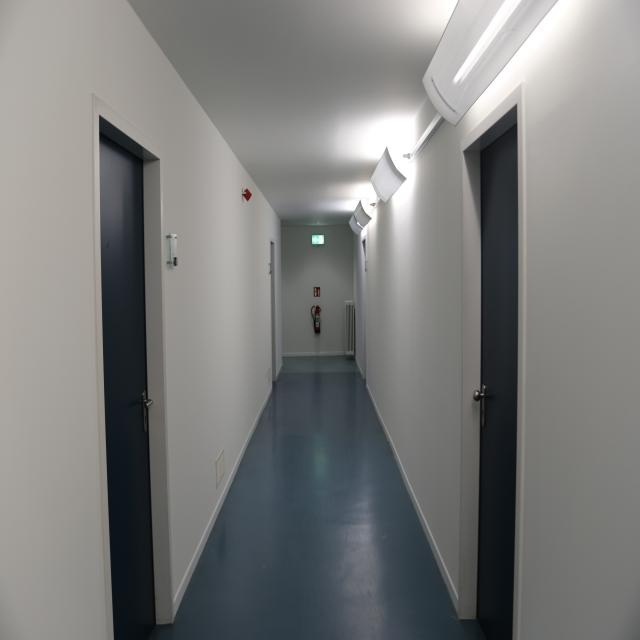



/content/yolov7/runs/detect/exp6/20210803_100139_jpg.rf.6a10c4578cfe19f11a73f6796fd93d67.jpg


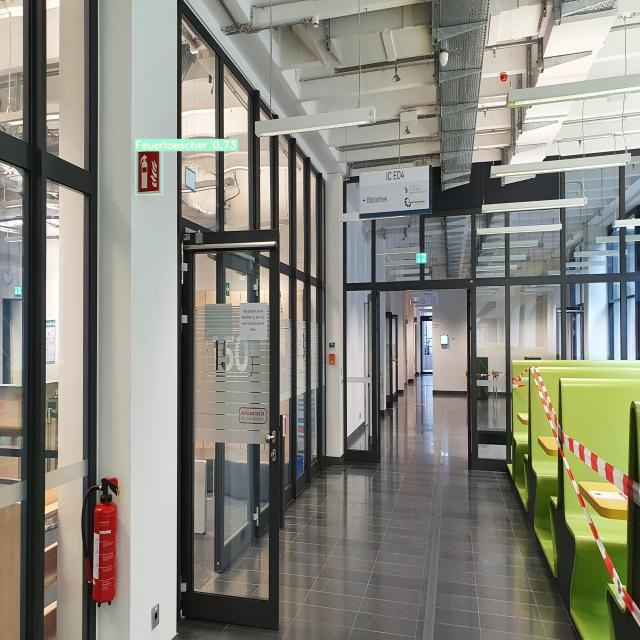



/content/yolov7/runs/detect/exp6/IMG_6143_JPG.rf.779c11455b9a79bd30ae6ce9873dc98b.jpg


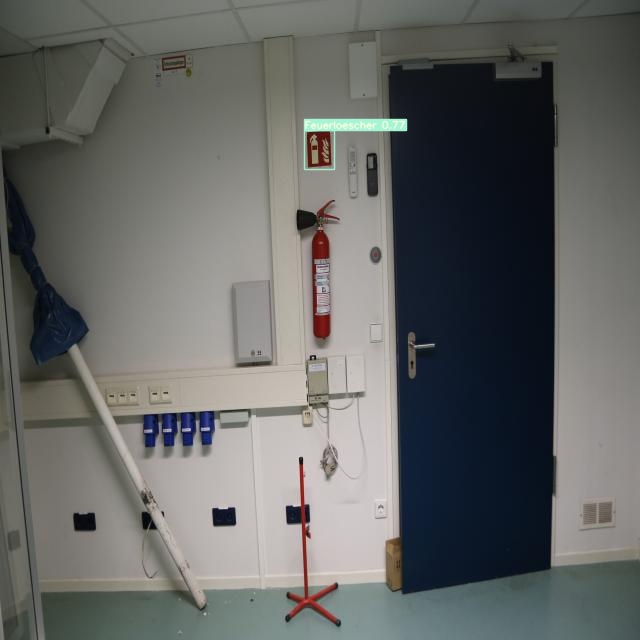



/content/yolov7/runs/detect/exp6/IMG_6296_JPG.rf.c97d56b8c6a9681707871bcd47f8f8c7.jpg


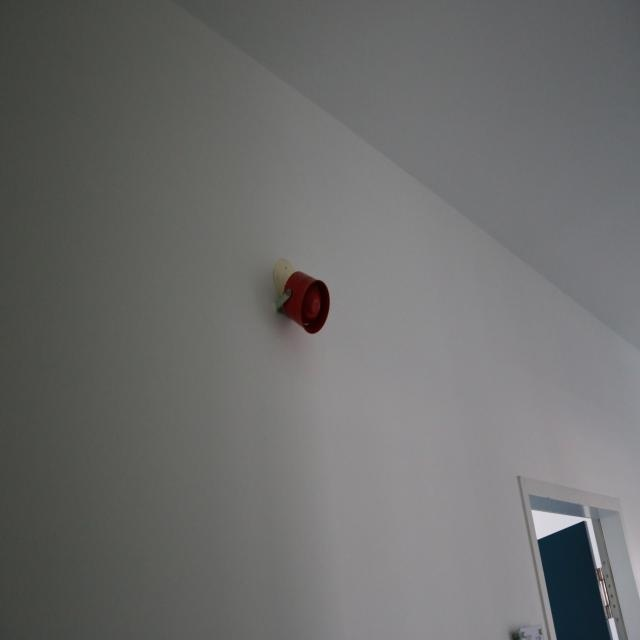



/content/yolov7/runs/detect/exp6/HHI1-129-_jpg.rf.0481f0b6310947d73db5a6586957b9bb.jpg


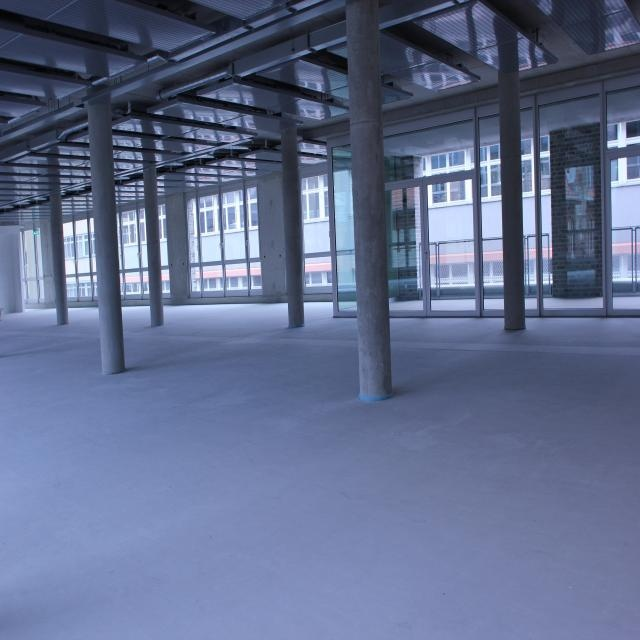



/content/yolov7/runs/detect/exp6/water_fire_de_44_jpg.rf.61cdb20996921f38c13485c11475cc91.jpg


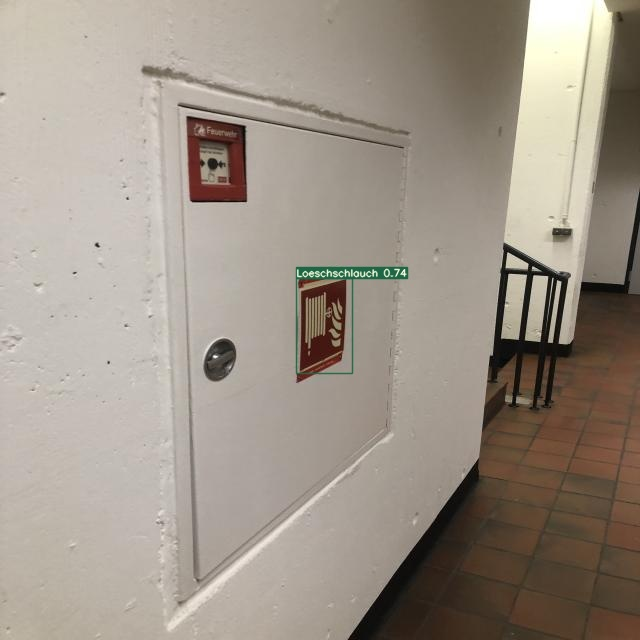



/content/yolov7/runs/detect/exp6/IMG_6327_JPG.rf.4d5f5db2a5405bfdc3296328876583b8.jpg


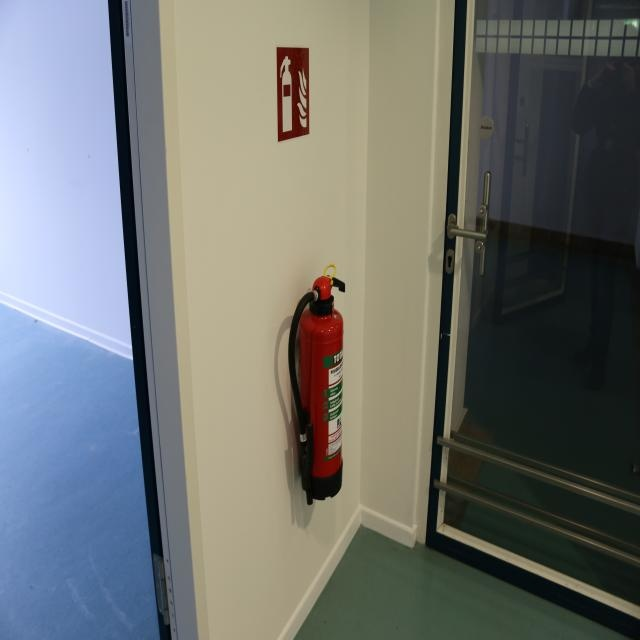



/content/yolov7/runs/detect/exp6/IMG_6216_JPG.rf.dde37cc0331e4b41b1c8c0d1f32bb45c.jpg


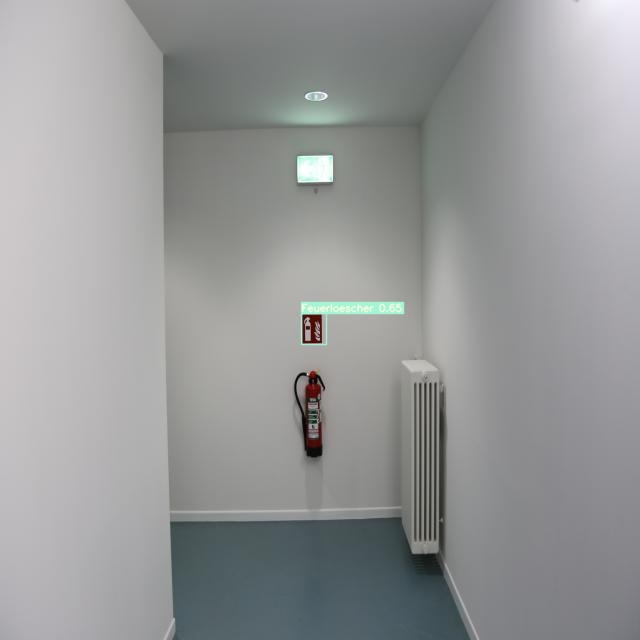



/content/yolov7/runs/detect/exp6/IMG_6155_JPG.rf.53d61216fff7e7d6eb53529c87680c63.jpg


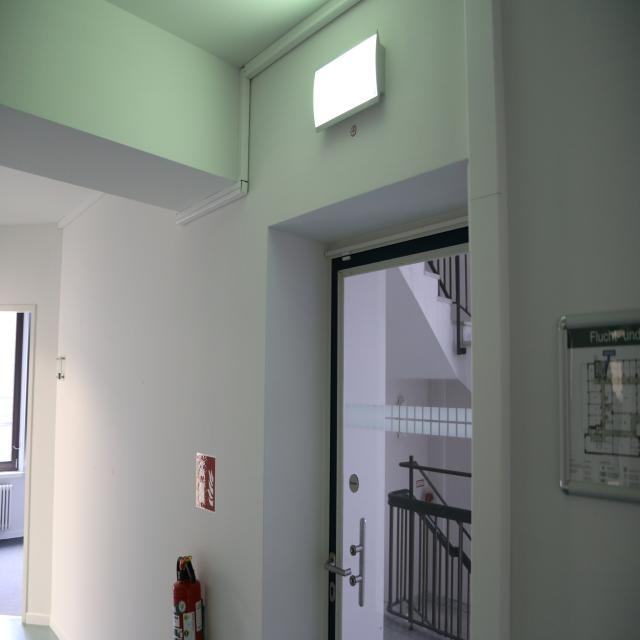



/content/yolov7/runs/detect/exp6/IMG_6174_JPG.rf.d32f67db219dfdd02e3bc73a0f9499a6.jpg


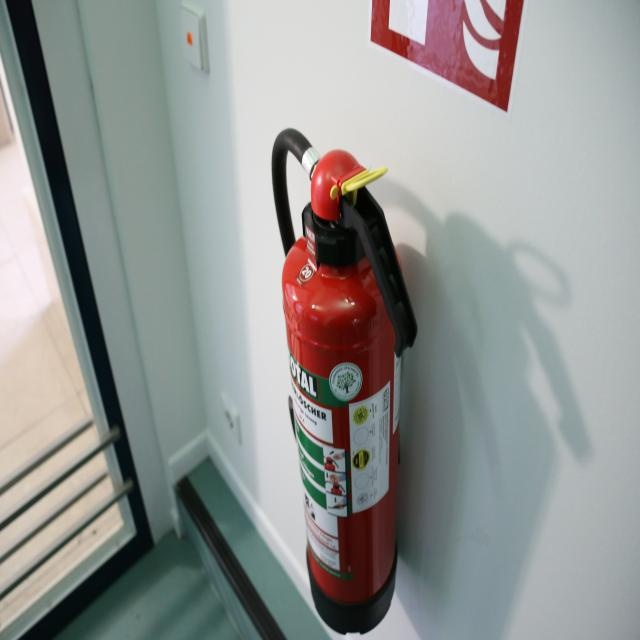



/content/yolov7/runs/detect/exp6/HHI1-116-_jpg.rf.2f9e137e2bb257b3c5ab79ee41e64865.jpg


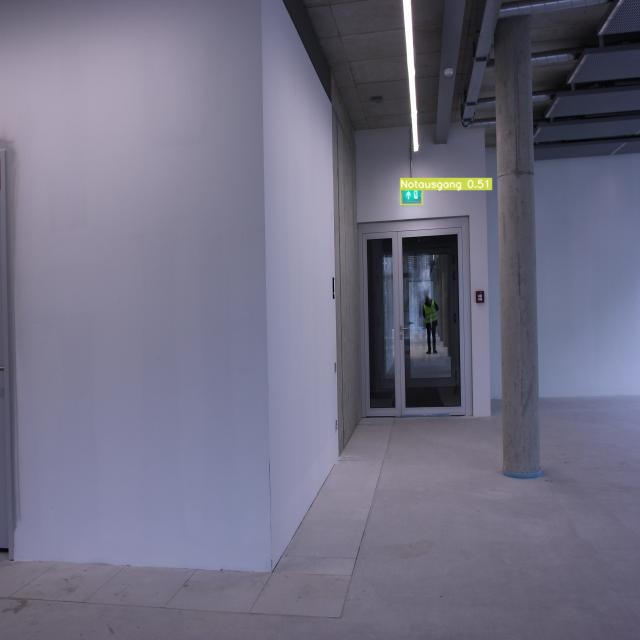



/content/yolov7/runs/detect/exp6/20210803_103652_jpg.rf.e715bb08d45b2c739e378ca2c56b3817.jpg


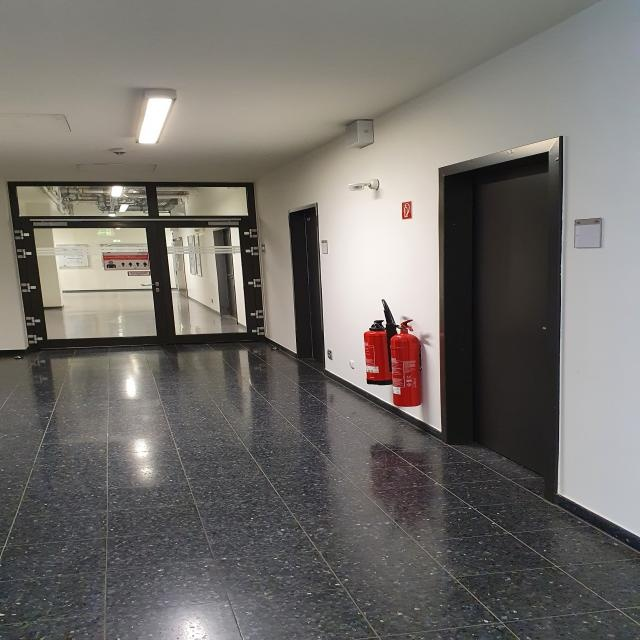



/content/yolov7/runs/detect/exp6/BIMA2-31-_png.rf.e8765dada54966110408d32d4aa1acad.jpg


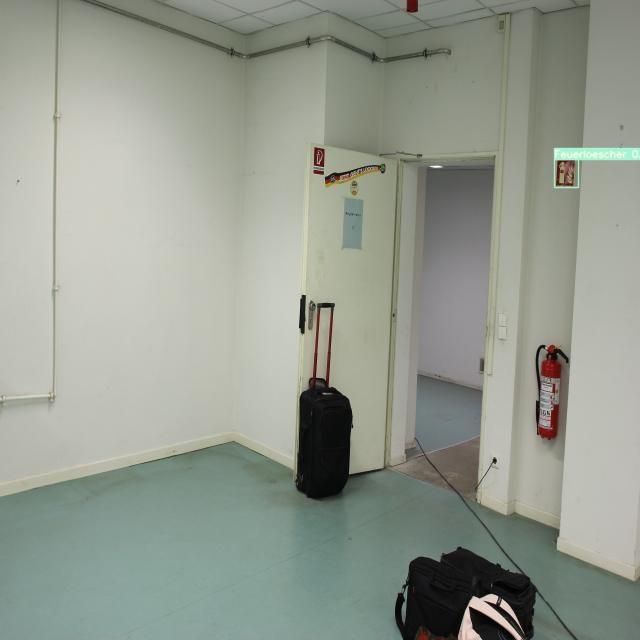



/content/yolov7/runs/detect/exp6/20210803_103641_jpg.rf.3af4320649d3f944239e634c3ac72e97.jpg


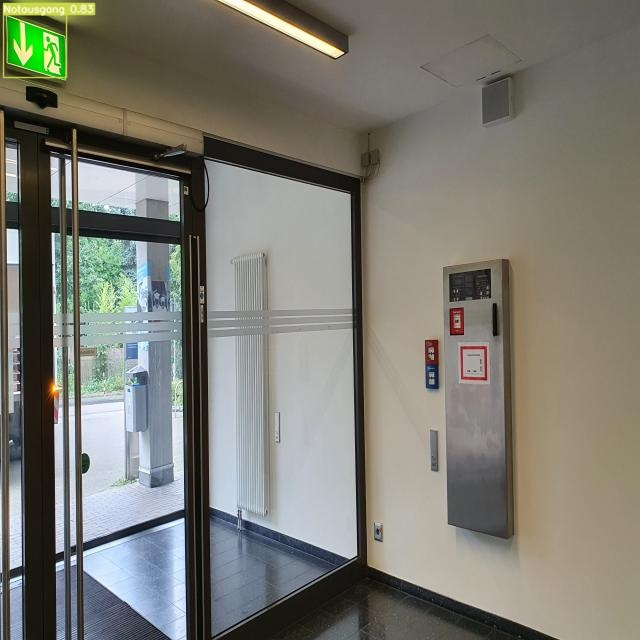



/content/yolov7/runs/detect/exp6/IMG_6153_JPG.rf.0359ffac8f1402b3f4da552d26902da2.jpg


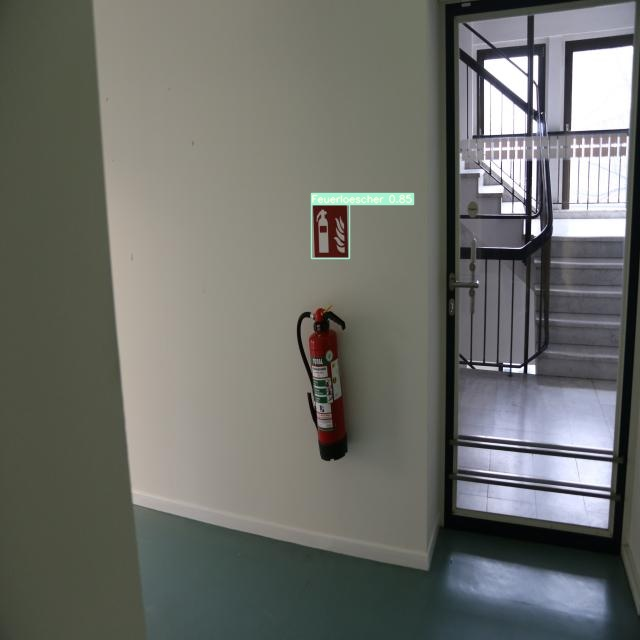



/content/yolov7/runs/detect/exp6/IMG_6305_JPG.rf.f8bb861441bb9f7e694cf6ba940e7232.jpg


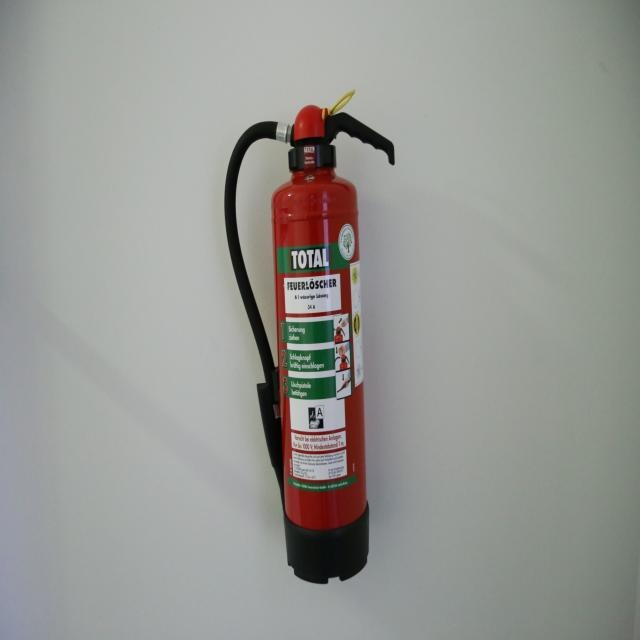



/content/yolov7/runs/detect/exp6/IMG_5790_JPG.rf.e72e322ea60ff43262f61d52512c1f57.jpg


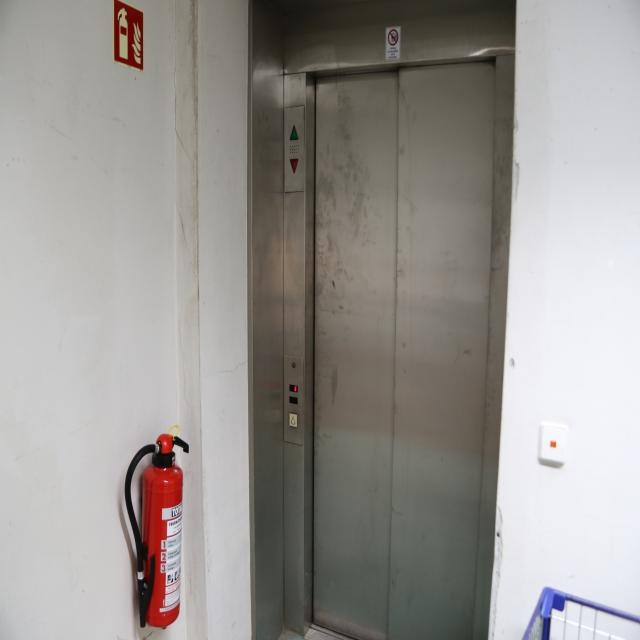



/content/yolov7/runs/detect/exp6/20210827_125405_jpg.rf.72ca25b867a833e6aefa230283168e3b.jpg


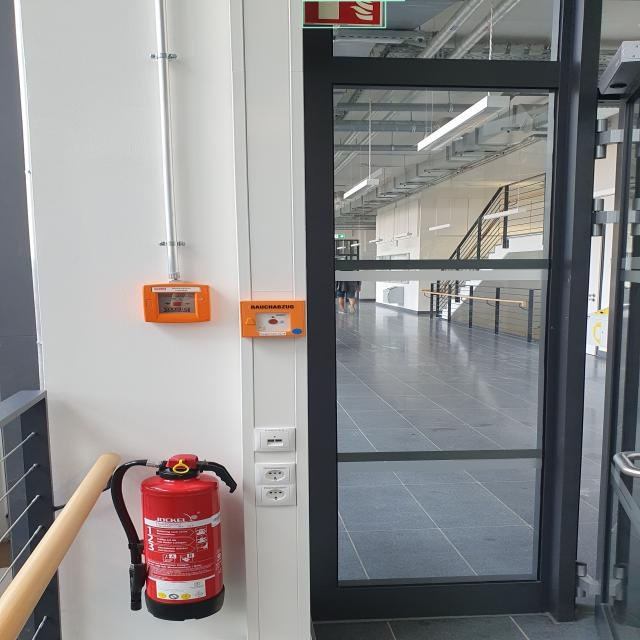



/content/yolov7/runs/detect/exp6/20210902_175204_jpg.rf.934db5ae4e20e99b15b3a87cee73e597.jpg


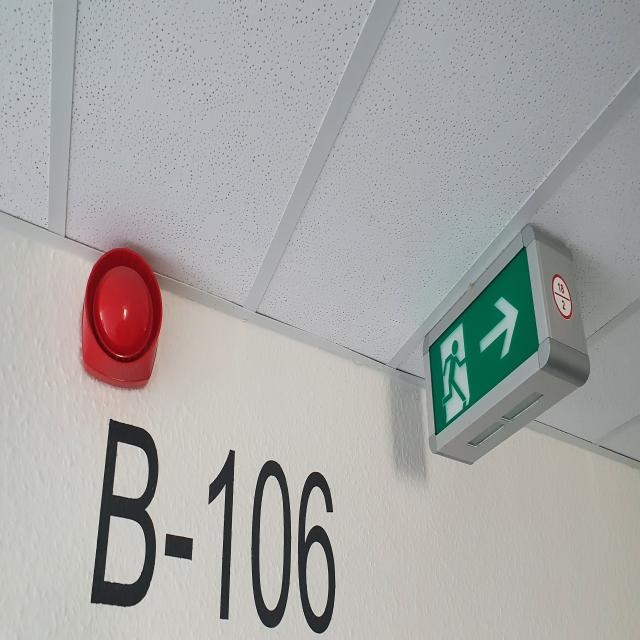



/content/yolov7/runs/detect/exp6/IMG_6412_JPG.rf.5a23d684e2986e7cf5d665591adc7c1a.jpg


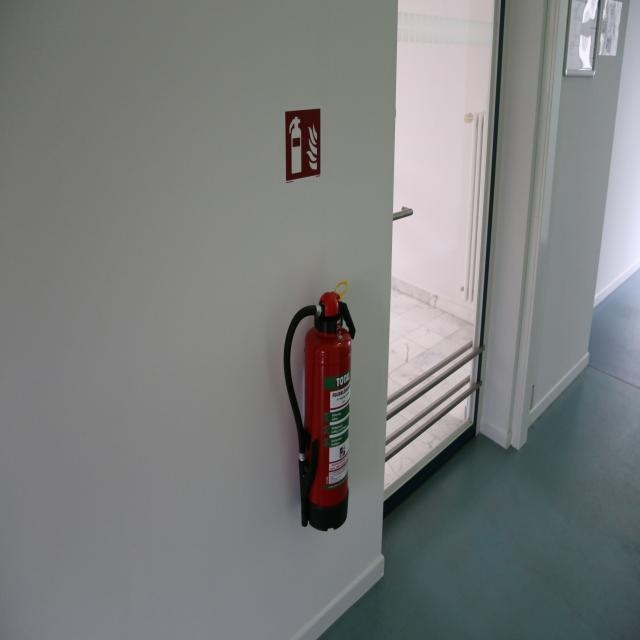



/content/yolov7/runs/detect/exp6/water_fire_de_64_jpg.rf.73c574da43f3afc76efb929aea17b765.jpg


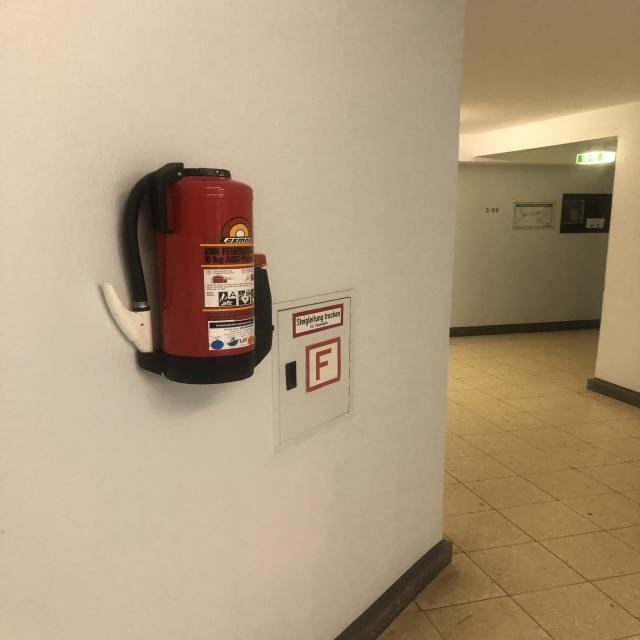



/content/yolov7/runs/detect/exp6/water_fire_de_74_jpg.rf.6761b55616efdeaa35703696b6109d71.jpg


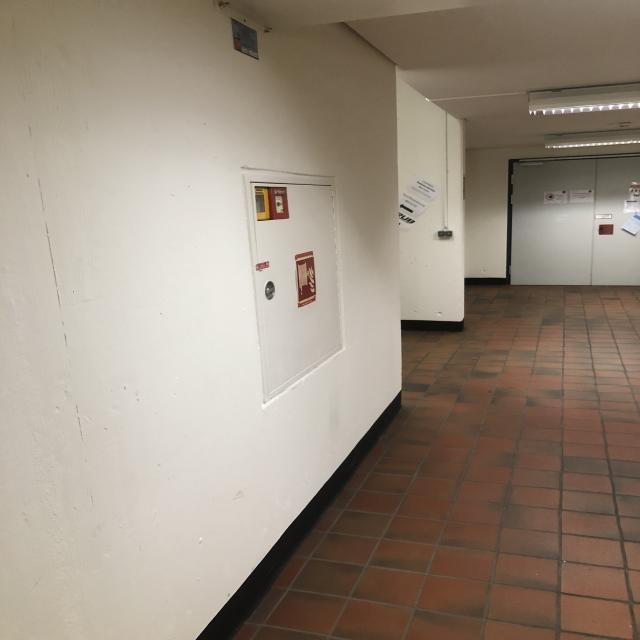



/content/yolov7/runs/detect/exp6/HHI1-132-_jpg.rf.c1238d2ced41737a5208a483f290f679.jpg


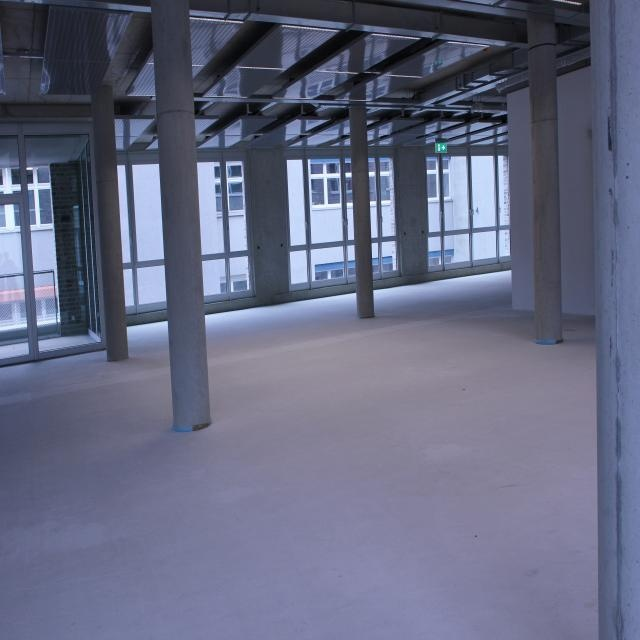



/content/yolov7/runs/detect/exp6/IMG_6411_JPG.rf.b00315883c58bcf669152d755382d0f2.jpg


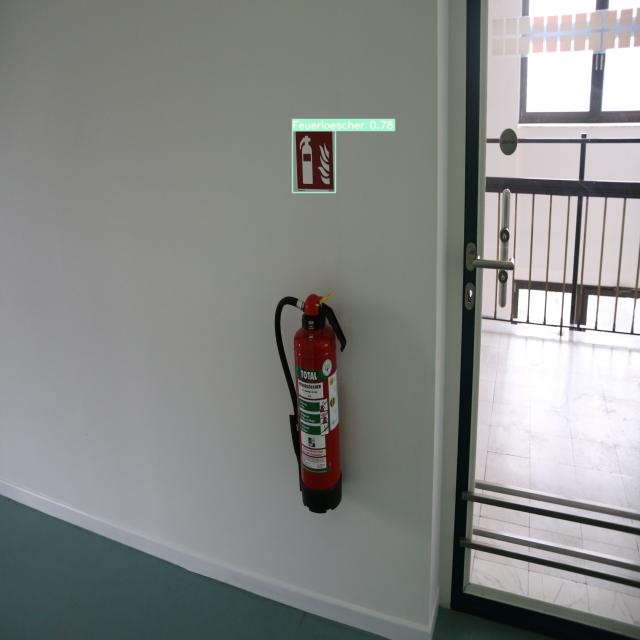



/content/yolov7/runs/detect/exp6/IMG_6171_JPG.rf.5385e3fb59e0bdbbb9a97959097c9f53.jpg


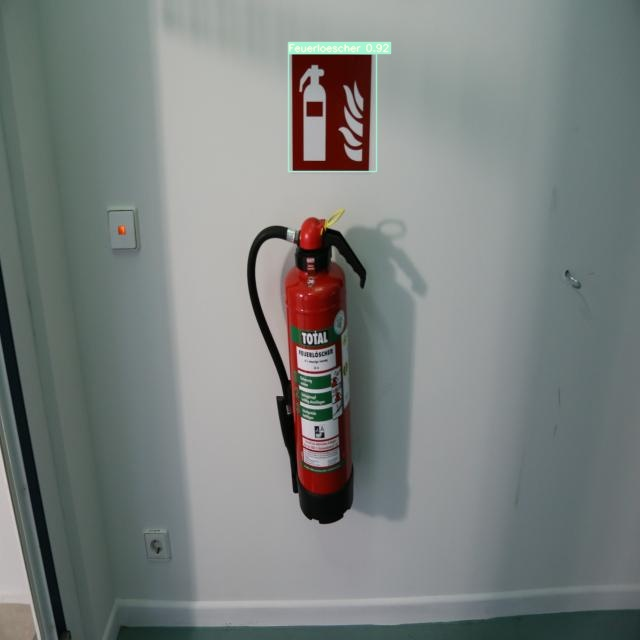



/content/yolov7/runs/detect/exp6/20210827_130030_jpg.rf.254313b48bbce236e9284e55838813fa.jpg


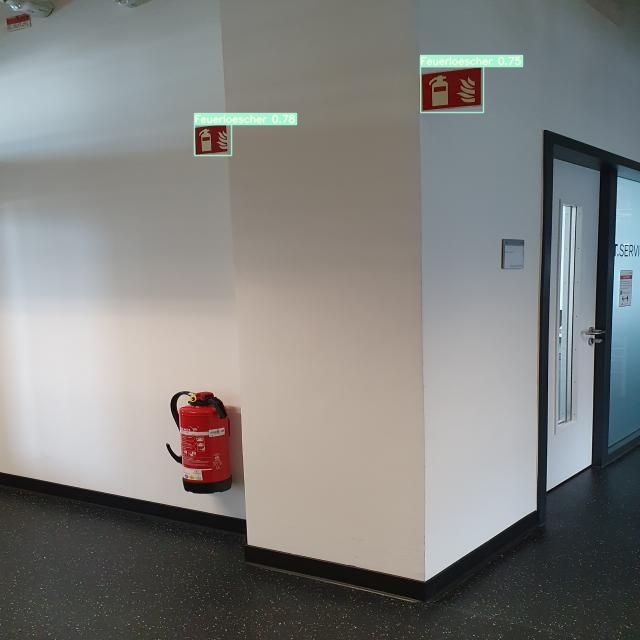



/content/yolov7/runs/detect/exp6/HHI1-128-_jpg.rf.eca44e460ce5c9d9b3ad30783bf6aef2.jpg


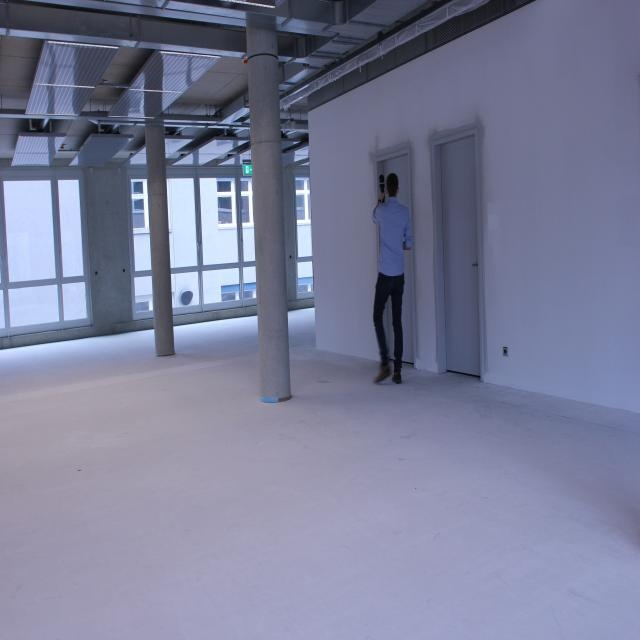

In [ ]:
#display inference on n test images

import glob

from IPython.display import Image, display


run_dir = "/content/yolov7/runs/detect/exp2/"
n = 100 # max 100 images

for imageName in glob.glob(run_dir+"*.jpg")+glob.glob(run_dir+"*.png"): #assuming JPG or PNG
    print(imageName)
    display(Image(filename=imageName))
    print("\n")
    n-=1
    if n < 0:
        break